## AMSA Assignment

Analysing climate data from 1960 to 2023 in Belgium and Netherlands <br>
Data available from: https://cds.climate.copernicus.eu/datasets/sis-biodiversity-cmip5-global?tab=overview <br>
Metadata available from: https://cds.climate.copernicus.eu/datasets/sis-biodiversity-cmip5-global?tab=documentation

2024 was excluded due to incomplete data for the year, half were measured values and the other half were forecasts

The model chosen was HadGEM2-CC (UK Met Office, UK) under ensemble number r1i1p1 with the experiment number RCP4.5, version 1.0. 

#### Explanation of the Variables


In [63]:
# Libraries used
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn as sk
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import seaborn as sns
from sklearn.cluster import KMeans

In [73]:
# Import the data set
data_path = "/Users/niamhcallinankeenan/amsa_assignment/combined_annual_data.csv"

data = pd.read_csv(data_path)

# First check for missing values
print(data.isnull().sum())

# Percentage of missing values
missing_percent = data.isnull().mean() * 100
print(missing_percent)

print(data.shape)
# There are no missing values in the data set, continue wuth analysis

time                                             0
latitude                                         0
longitude                                        0
precipitation_warmest_quarter                    0
surface-sensible-heat-flux_driest-quarter        0
evaporative-fraction_driest-quarter              0
surface-sensible-heat-flux_wettest-quarter       0
surface-latent-heat-flux_driest-quarter          0
mean_temp_warmest_quarter                        0
surface-sensible-heat-flux_warmest-quarter       0
surface-sensible-heat-flux_coldest-quarter       0
mean_temp_wettest_quarter                        0
surface-latent-heat-flux_warmest-quarter         0
surface-latent-heat-flux_coldest-quarter         0
volumetric-soil-water-layer-1_wettest-quarter    0
evaporative-fraction_warmest-quarter             0
mean_temp_annual                                 0
evaporative-fraction_coldest-quarter             0
volumetric-soil-water-layer-1_coldest-quarter    0
precipitaion_driest_quarter    

### Dimensionality Reduction

- SVD
- PCA
- tSNE
- UMAP

##### Singular Value Decomposition

- Step 1: Scale the data
- Step 2: Decide how many components to keep. Do this by looking at the explained variance ratio
- Step 3: 

Cumulative explained variance: [0.54983522 0.7001982  0.79825063 0.85847522 0.89102833 0.91059708
 0.92828443 0.9428288  0.95384006 0.96323417 0.97033291 0.97600982
 0.98041128 0.98369744 0.98655379 0.98894064 0.99092589 0.99252759
 0.9939365  0.99529844 0.99640373 0.99719019 0.99786976 0.99844023
 0.9989218  0.99929396 0.99947184 0.9996197  0.99974186 0.99982195
 0.99989311 0.99994141 0.99996743 0.99998326 0.99999465 1.        ]


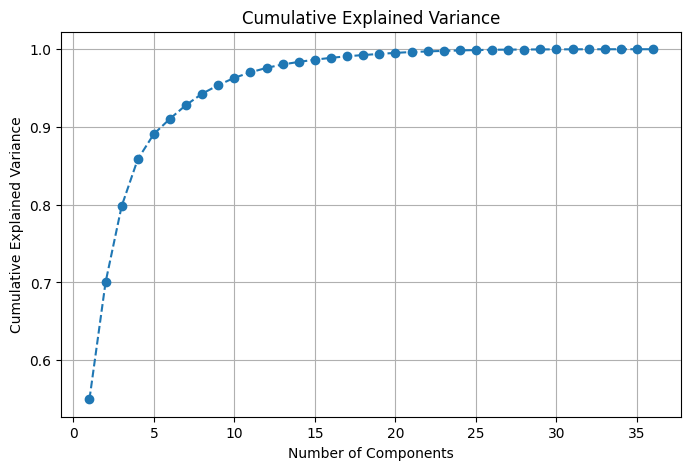

In [79]:
#Step 1: Standardize the data and keep the columns I know are important
# Standardize your data
# Columns that we want to keep (not standardize)
cols_to_keep = ["time", "latitude", "longitude"]

# Separate time, latitude, and longitude from the rest of the dataset
metadata = data[cols_to_keep]  # This keeps the non-standardized columns
data_reduced_target = data.drop(columns=cols_to_keep)  # Remaining features to standardize

# Standardize the remaining data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_reduced_target)

# Convert the scaled data back to a DataFrame (optional for easier interpretation)
data_scaled_df = pd.DataFrame(data_scaled, columns=data_reduced_target.columns)


#Step 2: Decide the number of components
# Apply TruncatedSVD for all components
svd = TruncatedSVD(n_components=min(data_scaled.shape[0], data_scaled.shape[1]), random_state=42)
svd.fit(data_scaled)

# Calculate cumulative explained variance
explained_variance = np.cumsum(svd.explained_variance_ratio_)
print("Cumulative explained variance:", explained_variance)

# Plot explained variance
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.show()



Explained variance with 15 components: 0.9865537876538171
Top Loadings for First Component:
 surface-latent-heat-flux_coldest-quarter      0.216146
potential-evaporation_coldest-quarter         0.215945
surface-sensible-heat-flux_wettest-quarter    0.207572
surface-sensible-heat-flux_coldest-quarter    0.205295
surface-latent-heat-flux_wettest-quarter      0.205058
Name: SVD_Component_1, dtype: float64


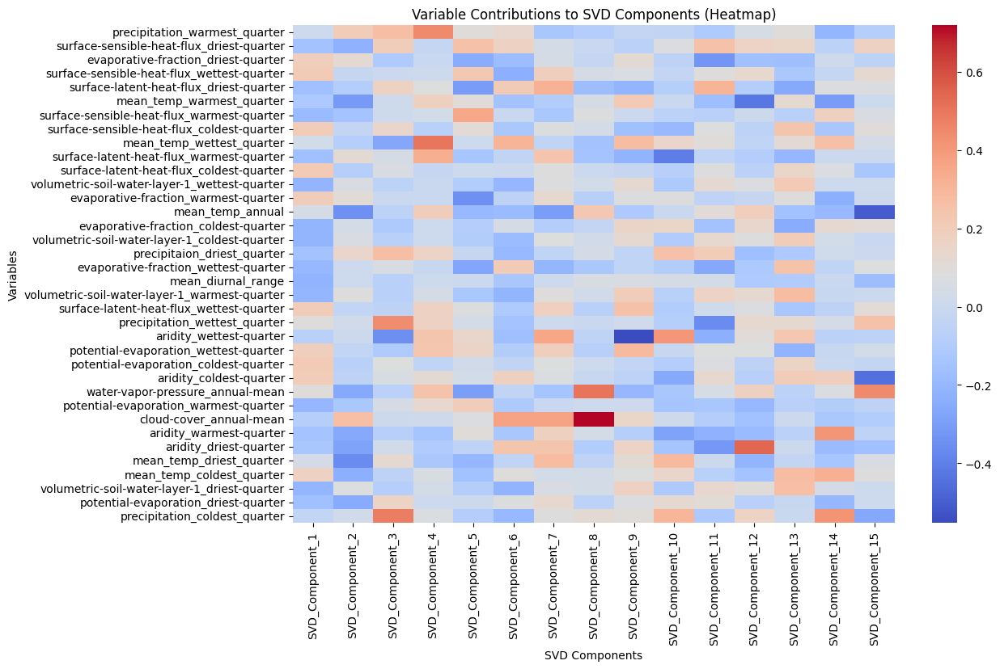

Explained variance with 2 components: 0.700198196359838
Top Loadings for First Component:
 surface-latent-heat-flux_coldest-quarter      0.216146
potential-evaporation_coldest-quarter         0.215945
surface-sensible-heat-flux_wettest-quarter    0.207572
surface-sensible-heat-flux_coldest-quarter    0.205295
surface-latent-heat-flux_wettest-quarter      0.205058
Name: SVD_Component_1, dtype: float64
   latitude  longitude  lat_bin  lon_bin region
0     49.25       2.25        0        0    0_0
1     49.25       2.75        0        0    0_0
2     49.25       3.25        0        0    0_0
3     49.25       3.75        0        1    0_1
4     49.25       4.25        0        1    0_1


/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_96462/3401206797.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["lat_bin"] = pd.cut(
/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_96462/3401206797.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["lon_bin"] = pd.cut(
/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_96462/3401206797.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_

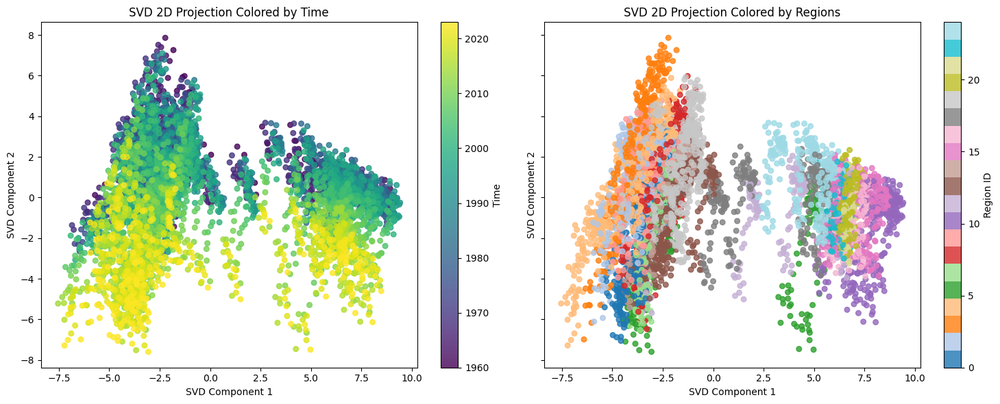

In [34]:


# Reduce to 15 components
svd = TruncatedSVD(n_components=15, random_state=42)
data_svd_15 = svd.fit_transform(data_scaled)
print("Explained variance with 15 components:", svd.explained_variance_ratio_.sum())

# Save results
reduced_15_df = pd.DataFrame(data_svd_15, columns=[f"SVD_{i+1}" for i in range(15)])
reduced_15_df = pd.concat([metadata.reset_index(drop=True), reduced_15_df], axis=1)
reduced_15_df.to_csv("svd_15_components.csv", index=False)

# Save variable contributions (loadings) for 15 components
loadings_15 = pd.DataFrame(
    svd.components_.T,  # Transpose to align variables with components
    index=data_reduced_target.columns,  # Variable names
    columns=[f"SVD_Component_{i+1}" for i in range(15)]
)
loadings_15.to_csv("svd_15_component_loadings.csv")
print("Top Loadings for First Component:\n", loadings_15["SVD_Component_1"].sort_values(ascending=False).head())

plt.figure(figsize=(12, 8))
sns.heatmap(
    loadings_15,
    cmap="coolwarm",
    annot=False,  # Set to True if you want numerical values
    cbar=True
)
plt.title("Variable Contributions to SVD Components (Heatmap)")
plt.xlabel("SVD Components")
plt.ylabel("Variables")
plt.show()

# Reduce to 2 components for visualization
svd2 = TruncatedSVD(n_components=2, random_state=42)
data_svd_2 = svd2.fit_transform(data_scaled)
print("Explained variance with 2 components:", svd2.explained_variance_ratio_.sum())

# Save results
reduced_2_df = pd.DataFrame(data_svd_2, columns=["SVD_1", "SVD_2"])
reduced_2_df = pd.concat([metadata.reset_index(drop=True), reduced_2_df], axis=1)
reduced_2_df.to_csv("svd_2_components.csv", index=False)

# Save variable contributions (loadings) for 2 components
loadings_2 = pd.DataFrame(
    svd2.components_.T,  # Transpose to align variables with components
    index=data_reduced_target.columns,  # Variable names
    columns=["SVD_Component_1", "SVD_Component_2"]
)
loadings_2.to_csv("svd_2_component_loadings.csv")
print("Top Loadings for First Component:\n", loadings_2["SVD_Component_1"].sort_values(ascending=False).head())


# Define 1-degree increments for latitude and longitude
lat_bins = np.arange(metadata["latitude"].min(), metadata["latitude"].max() + 1, 1)
lon_bins = np.arange(metadata["longitude"].min(), metadata["longitude"].max() + 1, 1)

# Bin latitude and longitude
metadata["lat_bin"] = pd.cut(
    metadata["latitude"], 
    bins=lat_bins, 
    labels=False, 
    include_lowest=True  # Include values at the lowest edge
)
metadata["lon_bin"] = pd.cut(
    metadata["longitude"], 
    bins=lon_bins, 
    labels=False, 
    include_lowest=True
)

# Combine latitude and longitude bins into region labels
metadata["region"] = metadata["lat_bin"].astype(str) + "_" + metadata["lon_bin"].astype(str)

# Preview the new metadata
print(metadata[["latitude", "longitude", "lat_bin", "lon_bin", "region"]].head())

# Convert regions into unique integers for coloring
metadata["region_id"] = metadata["region"].astype("category").cat.codes

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharex=True, sharey=True)

# Plot 1: Colored by time
scatter1 = axes[0].scatter(
    reduced_2_df["SVD_1"], 
    reduced_2_df["SVD_2"], 
    c=metadata["time"], 
    cmap="viridis", 
    alpha=0.8, 
    s=30
)
axes[0].set_title("SVD 2D Projection Colored by Time")
axes[0].set_xlabel("SVD Component 1")
axes[0].set_ylabel("SVD Component 2")
cbar1 = fig.colorbar(scatter1, ax=axes[0], label="Time")

# Plot 2: Colored by regions
scatter2 = axes[1].scatter(
    reduced_2_df["SVD_1"], 
    reduced_2_df["SVD_2"], 
    c=metadata["region_id"],  # Use region ID for color
    cmap="tab20",  # Discrete colormap for regions
    alpha=0.8, 
    s=30
)
axes[1].set_title("SVD 2D Projection Colored by Regions")
axes[1].set_xlabel("SVD Component 1")
axes[1].set_ylabel("SVD Component 2")
cbar2 = fig.colorbar(scatter2, ax=axes[1], label="Region ID")

plt.tight_layout()
plt.show()




##### Principal Component Analysis


Explained variance ratio (PCA): [0.54983522 0.15036297 0.09805243 0.06022459 0.03255311 0.01956875
 0.01768735 0.01454437 0.01101125 0.00939411 0.00709874 0.00567691
 0.00440146 0.00328616 0.00285635]
Cumulative explained variance (PCA): [0.54983522 0.7001982  0.79825063 0.85847522 0.89102833 0.91059708
 0.92828443 0.9428288  0.95384006 0.96323417 0.97033291 0.97600982
 0.98041128 0.98369744 0.98655379]
Top Loadings for First Component:
 surface-latent-heat-flux_coldest-quarter      0.216146
potential-evaporation_coldest-quarter         0.215945
surface-sensible-heat-flux_wettest-quarter    0.207572
surface-sensible-heat-flux_coldest-quarter    0.205295
surface-latent-heat-flux_wettest-quarter      0.205058
Name: PCA_Component_1, dtype: float64


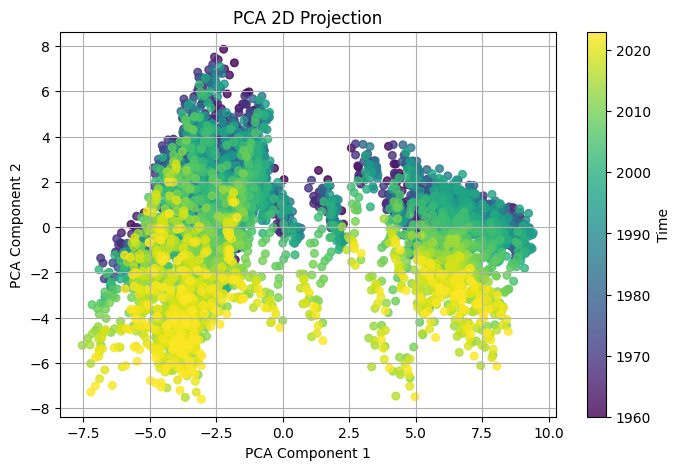

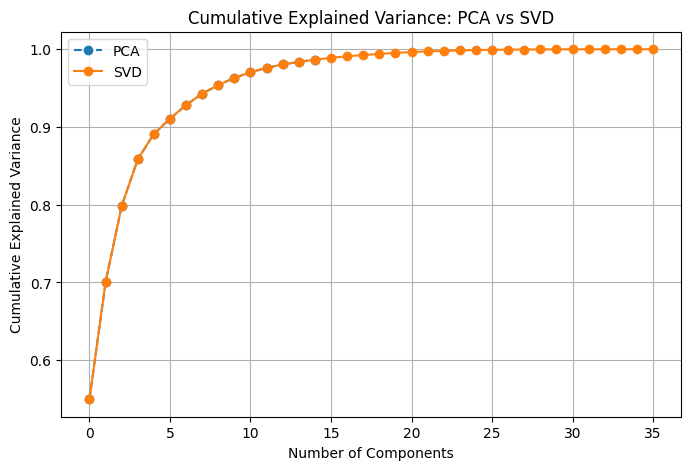

In [17]:
from sklearn.decomposition import PCA

# Perform PCA on the standardized data
pca = PCA(n_components=15)  # Retain up to 15 components or adjust as needed
data_pca = pca.fit_transform(data_scaled)

# Explained variance
print("Explained variance ratio (PCA):", pca.explained_variance_ratio_)
print("Cumulative explained variance (PCA):", pca.explained_variance_ratio_.cumsum())

# Save PCA results
pca_df = pd.DataFrame(data_pca, columns=[f"PCA_{i+1}" for i in range(data_pca.shape[1])])
pca_df = pd.concat([metadata.reset_index(drop=True), pca_df], axis=1)
pca_df.to_csv("pca_reduced_data.csv", index=False)


# Save variable contributions (loadings) for 15 components
pca_loadings_15 = pd.DataFrame(
    pca.components_.T,  # Transpose to align variables with components
    index=data_reduced_target.columns,  # Variable names
    columns=[f"PCA_Component_{i+1}" for i in range(15)]
)
pca_loadings_15.to_csv("pca_15_component_loadings.csv")
print("Top Loadings for First Component:\n", pca_loadings_15["PCA_Component_1"].sort_values(ascending=False).head())

# Scatter plot for the first two PCA components
plt.figure(figsize=(8, 5))
plt.scatter(
    data_pca[:, 0], 
    data_pca[:, 1], 
    c=metadata["time"],  # Color by time for visualization
    cmap="viridis", 
    alpha=0.8, 
    s=30
)
plt.title("PCA 2D Projection")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Time")
plt.grid()
plt.show()

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(
    np.cumsum(pca.explained_variance_ratio_), 
    label="PCA", marker="o", linestyle="--"
)
plt.plot(
    np.cumsum(svd.explained_variance_ratio_), 
    label="SVD", marker="o", linestyle="-"
)
plt.title("Cumulative Explained Variance: PCA vs SVD")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.legend()
plt.grid()
plt.show()




#### tSNE


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


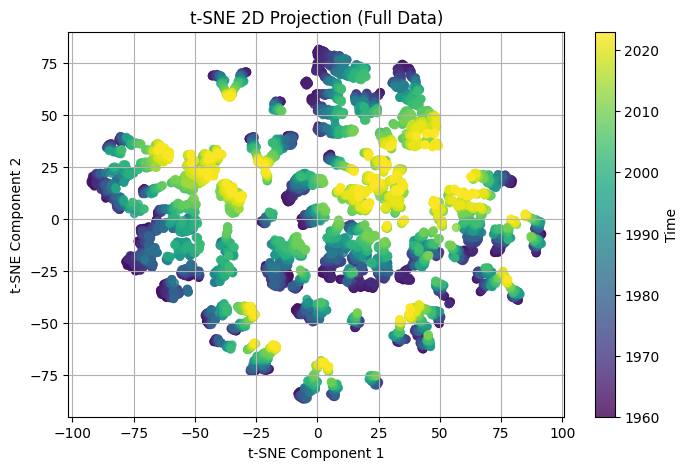

/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_42392/3939023536.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["region_id"] = metadata["region"].astype("category").cat.codes


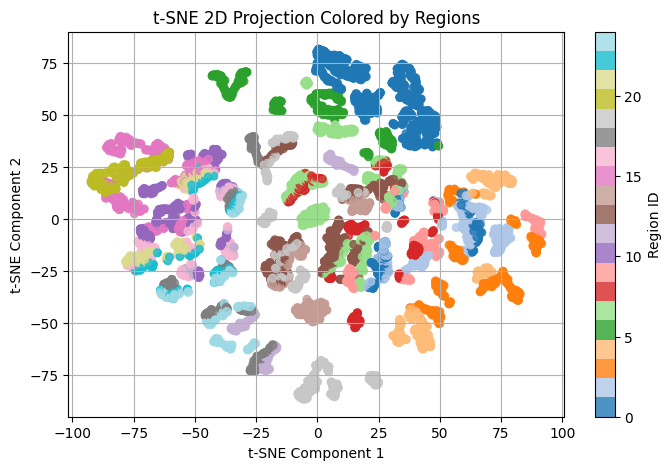

In [82]:
# Perform t-SNE on the full dataset
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
data_tsne = tsne.fit_transform(data_scaled)

# Visualize t-SNE results
plt.figure(figsize=(8, 5))
plt.scatter(
    data_tsne[:, 0], 
    data_tsne[:, 1], 
    c=metadata["time"],  # Color by a variable (e.g., time)
    cmap="viridis", 
    alpha=0.8, 
    s=30
)
plt.title("t-SNE 2D Projection (Full Data)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.colorbar(label="Time")
plt.grid()
plt.show()

# Assign unique numeric IDs to regions for coloring
metadata["region_id"] = metadata["region"].astype("category").cat.codes

# Create t-SNE scatter plot colored by regions
plt.figure(figsize=(8, 5))
scatter = plt.scatter(
    data_tsne[:, 0], 
    data_tsne[:, 1], 
    c=metadata["region_id"],  # Color by region
    cmap="tab20",  # Use a discrete colormap for regions
    alpha=0.8, 
    s=30
)
plt.colorbar(scatter, label="Region ID")
plt.title("t-SNE 2D Projection Colored by Regions")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.grid()
plt.show()

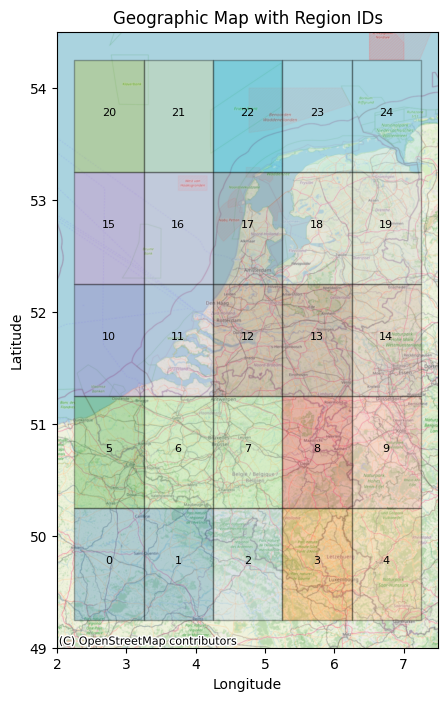

In [ ]:
# For creating the region map legend used for colouring by region
#-------------------------------------------

import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from shapely.geometry import Polygon

# Create polygons for regions
region_polygons = []
region_labels = []

for lat_bin in range(len(lat_bins) - 1):
    for lon_bin in range(len(lon_bins) - 1):
        lat_start = lat_bins[lat_bin]
        lat_end = lat_bins[lat_bin + 1]
        lon_start = lon_bins[lon_bin]
        lon_end = lon_bins[lon_bin + 1]

       
        polygon = Polygon([
            (lon_start, lat_start),
            (lon_start, lat_end),
            (lon_end, lat_end),
            (lon_end, lat_start),
        ])
        region_polygons.append(polygon)
        region_labels.append(f"{lat_bin}_{lon_bin}")

# Create GeoDataFrame
regions_gdf = gpd.GeoDataFrame({
    "region": region_labels,  # Same region labels as metadata
    "geometry": region_polygons
}, crs="EPSG:4326")

# Assign region_id using the same method as metadata
regions_gdf["region_id"] = regions_gdf["region"].astype("category").cat.codes


fig, ax = plt.subplots(figsize=(12, 8))

# Plot regions colored by region_id
regions_gdf.plot(
    ax=ax,
    column="region_id", 
    cmap="tab20",        
    alpha=0.3,
    edgecolor="black"
)

# Annotate each region with its region_id
for idx, row in regions_gdf.iterrows():
    centroid = row["geometry"].centroid
    ax.text(centroid.x, centroid.y, str(row["region_id"]), fontsize=8, ha="center", color="black")

# Add basemap
ctx.add_basemap(ax, crs=regions_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Map details
plt.title("Geographic Map with Region IDs")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


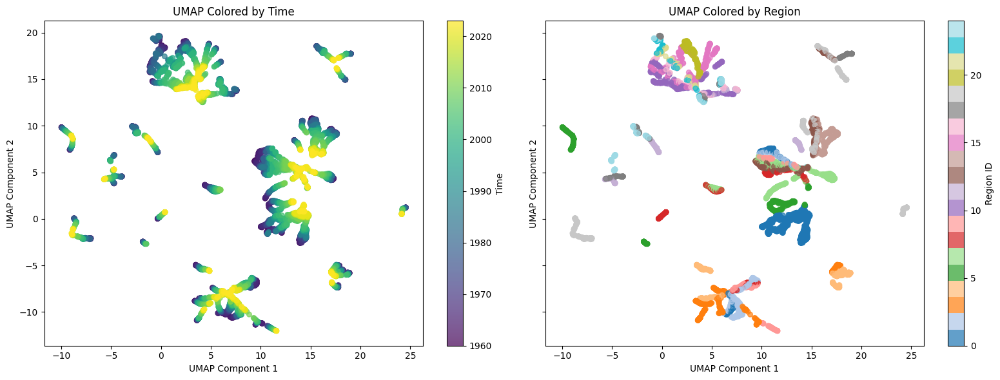

In [59]:

import umap.umap_ as umap

# Perform UMAP
reducer = umap.UMAP(n_components=2, random_state=42, min_dist=0.1)
data_umap = reducer.fit_transform(data_scaled)

# Save the UMAP-reduced data to a DataFrame
umap_df = pd.DataFrame(data_umap, columns=["UMAP_1", "UMAP_2"])
umap_df = pd.concat([metadata.reset_index(drop=True), umap_df], axis=1)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=True, sharey=True)

# Plot UMAP colored by time
scatter_time = axes[0].scatter(
    umap_df["UMAP_1"], 
    umap_df["UMAP_2"], 
    c=umap_df["time"],  # Color by time
    cmap="viridis", 
    alpha=0.7, 
    s=30
)
axes[0].set_title("UMAP Colored by Time")
axes[0].set_xlabel("UMAP Component 1")
axes[0].set_ylabel("UMAP Component 2")
fig.colorbar(scatter_time, ax=axes[0], label="Time")

# Plot UMAP colored by region
scatter_region = axes[1].scatter(
    umap_df["UMAP_1"], 
    umap_df["UMAP_2"], 
    c=umap_df["region_id"],  # Color by region_id
    cmap="tab20", 
    alpha=0.7, 
    s=30
)
axes[1].set_title("UMAP Colored by Region")
axes[1].set_xlabel("UMAP Component 1")
axes[1].set_ylabel("UMAP Component 2")
fig.colorbar(scatter_region, ax=axes[1], label="Region ID")

plt.tight_layout()
plt.show()


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


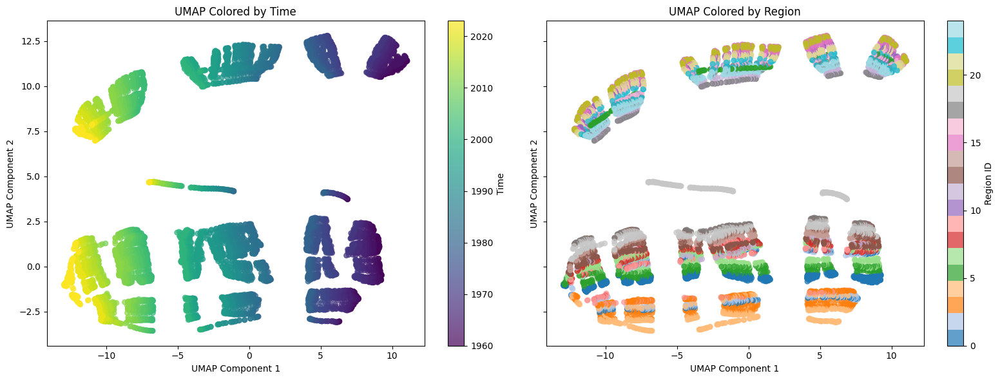

In [61]:

svd_data = pd.read_csv("svd_15_components.csv")
pca_data = pd.read_csv("pca_reduced_data.csv")

# Perform UMAP
reducer = umap.UMAP(n_components=2, random_state=42, min_dist=0.1)
data_svd_umap = reducer.fit_transform(svd_data)

# Save the UMAP-reduced data to a DataFrame
umap_df = pd.DataFrame(data_svd_umap, columns=["UMAP_1", "UMAP_2"])
umap_df = pd.concat([metadata.reset_index(drop=True), umap_df], axis=1)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=True, sharey=True)

# Plot UMAP colored by time
scatter_time = axes[0].scatter(
    umap_df["UMAP_1"], 
    umap_df["UMAP_2"], 
    c=umap_df["time"],  # Color by time
    cmap="viridis", 
    alpha=0.7, 
    s=30
)
axes[0].set_title("UMAP Colored by Time")
axes[0].set_xlabel("UMAP Component 1")
axes[0].set_ylabel("UMAP Component 2")
fig.colorbar(scatter_time, ax=axes[0], label="Time")

# Plot UMAP colored by region
scatter_region = axes[1].scatter(
    umap_df["UMAP_1"], 
    umap_df["UMAP_2"], 
    c=umap_df["region_id"],  # Color by region_id
    cmap="tab20", 
    alpha=0.7, 
    s=30
)
axes[1].set_title("UMAP Colored by Region")
axes[1].set_xlabel("UMAP Component 1")
axes[1].set_ylabel("UMAP Component 2")
fig.colorbar(scatter_region, ax=axes[1], label="Region ID")

plt.tight_layout()
plt.show()

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



Stress values:
--------------------------------------------------
SVD: 0.261
PCA: 0.261
t-SNE: 8.817
UMAP: 1.037


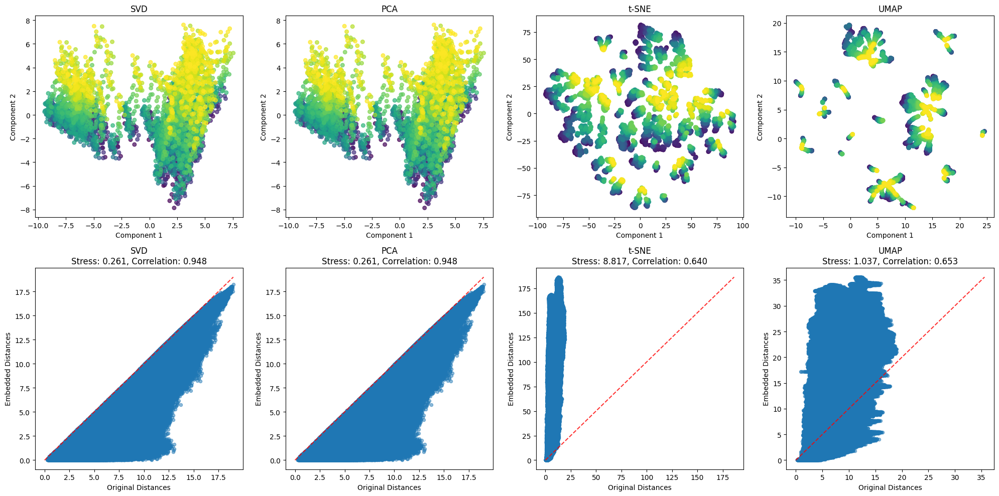

In [ ]:
#For testing the dimensionalality reduction methods
#-------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import TSNE
import umap.umap_ as umap

# Function to calculate stress
def calculate_stress(orig_dist, embedded_dist):
    return np.sqrt(np.sum((orig_dist - embedded_dist)**2)) / np.sqrt(np.sum(orig_dist**2))

# Function to create Shepard diagram
def plot_shepard_diagram(ax, original_distances, embedded_distances, method_name):
    # Flatten the distance matrices
    orig_dist_flat = original_distances[np.triu_indices(original_distances.shape[0], k=1)]
    emb_dist_flat = embedded_distances[np.triu_indices(embedded_distances.shape[0], k=1)]

    # Calculate stress
    stress = calculate_stress(orig_dist_flat, emb_dist_flat)

    # Calculate Spearman correlation
    correlation, _ = spearmanr(orig_dist_flat, emb_dist_flat)

    # Create scatter plot
    ax.scatter(orig_dist_flat, emb_dist_flat, alpha=0.5, s=20)

    # Add perfect correlation line
    min_dist = min(orig_dist_flat.min(), emb_dist_flat.min())
    max_dist = max(orig_dist_flat.max(), emb_dist_flat.max())
    ax.plot([min_dist, max_dist], [min_dist, max_dist], 'r--', alpha=0.8)

    ax.set_xlabel('Original Distances')
    ax.set_ylabel('Embedded Distances')
    ax.set_title(f'{method_name}\nStress: {stress:.3f}, Correlation: {correlation:.3f}')

# Calculate original distances
original_distances = pairwise_distances(data_scaled)

# Generate embeddings using different methods
embeddings = {
    'SVD': TruncatedSVD(n_components=2).fit_transform(data_scaled),
    'PCA': PCA(n_components=2).fit_transform(data_scaled),
    't-SNE': TSNE(n_components=2, random_state=42).fit_transform(data_scaled),
    'UMAP': umap.UMAP(n_components=2, random_state=42).fit_transform(data_scaled)
}

# Calculate embedded distances for each method
embedded_distances = {
    method: pairwise_distances(embedding)
    for method, embedding in embeddings.items()
}

# Create figure with 2 rows and 4 columns
fig = plt.figure(figsize=(20, 10))

# Plot projections (top row) and Shepard diagrams (bottom row)
for idx, (method, embedding) in enumerate(embeddings.items()):
    # Projection plot (top row)
    ax_proj = plt.subplot(2, 4, idx + 1)
    ax_proj.scatter(embedding[:, 0], embedding[:, 1], c=metadata["time"], cmap="viridis", alpha=0.7, s=30)
    ax_proj.set_title(method)
    ax_proj.set_xlabel("Component 1")
    ax_proj.set_ylabel("Component 2")

    # Shepard diagram (bottom row)
    ax_shep = plt.subplot(2, 4, idx + 5)
    plot_shepard_diagram(ax_shep, original_distances, embedded_distances[method], method)

# Print stress values
print("\nStress values:")
print("-" * 50)
for method, distances in embedded_distances.items():
    stress = calculate_stress(original_distances[np.triu_indices(original_distances.shape[0], k=1)], 
                              distances[np.triu_indices(distances.shape[0], k=1)])
    print(f"{method}: {stress:.3f}")

plt.tight_layout()
plt.show()


This visualization of **Shepard diagrams** provides insight into how well each dimensionality reduction method (SVD, PCA, t-SNE, UMAP) preserves the original pairwise distances in the lower-dimensional embedding. Here's how to interpret the results:

1. _The Perfect Correlation Line (Red Dashed Line)_
The red dashed line represents a scenario where the embedded distances perfectly match the original distances (perfect preservation of structure).
Points close to the red line indicate that the method preserved the pairwise distances well.
Points far from the red line indicate distortion in the embedded distances compared to the original.
2. _Stress Values_ <br>
Stress quantifies how much distortion occurred between the original and embedded distances:
Lower stress = better preservation of pairwise distances.
Higher stress = more distortion in the embedding.
Observations:
SVD & PCA: Both have low stress (0.261) and excellent alignment with the perfect correlation line. These methods preserve global structure and distances very well.
t-SNE: Shows high stress (8.817) and significant distortion. This is expected as t-SNE sacrifices global structure to prioritize local clusters.
UMAP: Intermediate stress (1.037), showing a tradeoff between global and local structure. It preserves more global structure than t-SNE but less than SVD/PCA.
3. _Correlation Values_ <br>
Spearman Correlation measures the monotonic relationship between original and embedded distances:
Higher correlation = better preservation of rank-order relationships in distances.
Lower correlation = more distortion of the relative rankings of distances.
Observations:
SVD & PCA: High correlation (0.948), indicating excellent preservation of rank-order relationships.
t-SNE: Moderate correlation (0.640), reflecting its focus on preserving local neighborhoods rather than global rankings.
UMAP: Slightly higher correlation than t-SNE (0.653), suggesting better rank preservation while still balancing global and local structure.
4. _Scatter Plots_ <br>
The scatter plots reveal the degree of preservation:

SVD & PCA: <br>
The points are tightly aligned with the red dashed line.
These methods minimize distortion and are ideal for tasks where global distances are important. <br>
t-SNE: <br>
The points deviate significantly from the red line, with many clustered near the origin.
This suggests that t-SNE compresses most of the distances into smaller ranges to prioritize local neighborhoods. <br>
UMAP:<be>
The points are more spread out than in t-SNE but not as well-aligned as in SVD or PCA.
UMAP balances local clustering with moderate preservation of global distances.<br>


#### If Global Structure Matters:

SVD or PCA:
Low stress and high correlation make these the best choices when preserving global distances and relationships is crucial.
If Local Clusters Matter:

t-SNE:
Despite its high stress and lower correlation, t-SNE is the best for identifying and visualizing local clusters. It's commonly used in tasks like single-cell data analysis or clustering exploration.
If a Balance is Needed:

UMAP:
UMAP strikes a compromise between global structure and local clustering.
Use UMAP if you need to preserve some global trends while still capturing local relationships effectively.

Why Global Trends Matter for Climate Data
Spatial and Temporal Relationships:
Climate data typically involves measurements distributed across space (latitude/longitude) and time.
Preserving these global relationships ensures that distances between points in the reduced space reflect actual similarities or differences in the data.
Interpretation of Patterns:
PCA and SVD allow you to understand which variables or components explain the most variance in your data.
These methods maintain the overall structure, making it easier to interpret large-scale climate trends, such as seasonal cycles, long-term warming, or spatial gradients.
Applications in Climate Science:
Studies involving atmospheric circulation, oceanic currents, or large-scale phenomena like El Niño require global coherence to identify drivers of variability.




## Clustering 

#### K Means CLustering


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.1

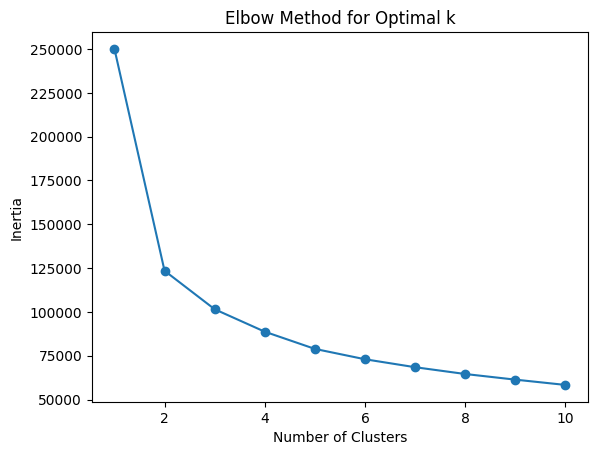

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.1

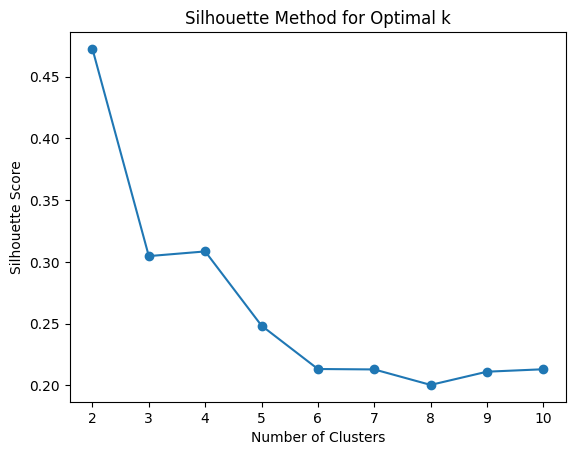

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.1

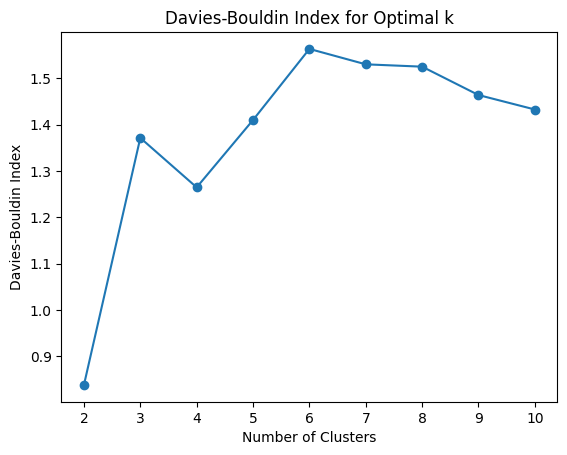

In [ ]:
# Testing optimal number of clusters
#-------------------------------------------
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


svd_data = pd.read_csv("svd_15_components.csv")
data_pca = pd.read_csv("pca_reduced_data.csv")

# Calculate inertia for different numbers of clusters
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_pca)
    inertia.append(kmeans.inertia_)

# Plot inertia vs. number of clusters
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

# Calculate silhouette score for different numbers of clusters
sil_scores = []
for k in range(2, 11):  # silhouette score cannot be calculated for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(data_pca)
    sil_score = silhouette_score(data_pca, cluster_labels)
    sil_scores.append(sil_score)

# Plot silhouette scores vs. number of clusters
plt.plot(range(2, 11), sil_scores, marker='o')
plt.title('Silhouette Method for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

# Calculate Davies-Bouldin index for different numbers of clusters
db_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(data_pca)
    db_score = davies_bouldin_score(data_pca, cluster_labels)
    db_scores.append(db_score)

# Plot Davies-Bouldin index vs. number of clusters
plt.plot(range(2, 11), db_scores, marker='o')
plt.title('Davies-Bouldin Index for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


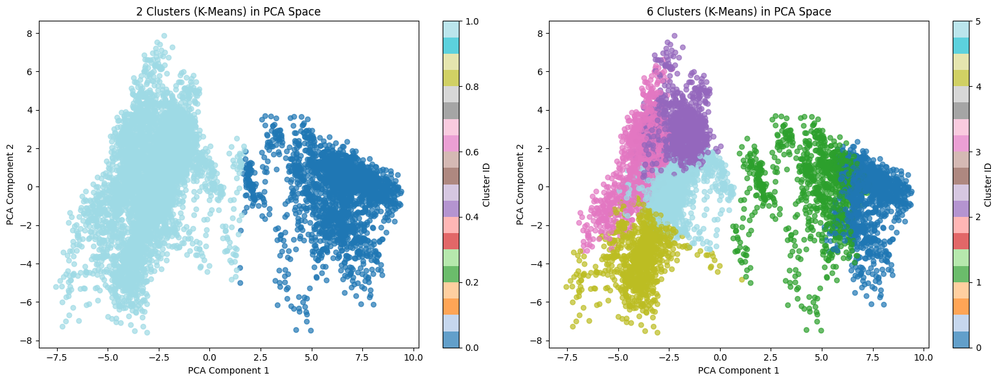

Cluster Centers for 2 Clusters in PCA Space:
      PCA_1     PCA_2     PCA_3     PCA_4     PCA_5     PCA_6     PCA_7  \
0  6.299939 -0.296358  0.444635 -0.122842  0.095579 -0.009486 -0.017741   
1 -2.831535  0.133200 -0.199843  0.055212 -0.042958  0.004263  0.007974   

      PCA_8     PCA_9    PCA_10    PCA_11    PCA_12    PCA_13    PCA_14  \
0 -0.002019 -0.038917  0.005629 -0.028714 -0.017900  0.031833 -0.035327   
1  0.000907  0.017492 -0.002530  0.012906  0.008045 -0.014307  0.015878   

     PCA_15  
0  0.014966  
1 -0.006727  
Cluster Centers for 6 Clusters in PCA Space:
      PCA_1     PCA_2     PCA_3     PCA_4     PCA_5     PCA_6     PCA_7  \
0  7.200421 -0.442923 -0.478427 -1.167965 -0.195186 -0.212930  0.022577   
1  4.812398 -0.134023  1.768481  1.341533  0.477641  0.344100 -0.129030   
2 -1.939057  2.838153 -1.397244  0.360642  0.422373 -0.210571 -0.136229   
3 -4.081251  1.111919  2.809778 -0.828248 -0.317907 -0.343655  0.132429   
4 -3.958298 -3.745490 -0.223318  0.111735

In [ ]:
# Apply KMeans clustering in PCA space
#-------------------------------------------
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import pandas as pd

# Apply KMeans clustering with 2 clusters in PCA space
kmeans_2 = KMeans(n_clusters=2, random_state=42)
cluster_labels_2 = kmeans_2.fit_predict(data_pca)  # Using PCA-reduced data

# Apply KMeans clustering with 6 clusters in PCA space
kmeans_6 = KMeans(n_clusters=6, random_state=42)
cluster_labels_6 = kmeans_6.fit_predict(data_pca)

# Ensure pca_df is defined correctly with PCA results and metadata
pca_df = pd.DataFrame(data_pca, columns=[f"PCA_{i+1}" for i in range(data_pca.shape[1])])
pca_df = pd.concat([metadata.reset_index(drop=True), pca_df], axis=1)

# Add the cluster labels to the PCA DataFrame
pca_df["Cluster 2"] = cluster_labels_2
pca_df["Cluster 6"] = cluster_labels_6

# Visualize the clusters with 2 clusters in PCA space
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 2 clusters
scatter_2 = axes[0].scatter(
    pca_df["PCA_1"], 
    pca_df["PCA_2"], 
    c=pca_df["Cluster 2"], 
    cmap="tab20",
    alpha=0.7,
    s=30
)
axes[0].set_title("2 Clusters (K-Means) in PCA Space")
axes[0].set_xlabel("PCA Component 1")
axes[0].set_ylabel("PCA Component 2")
fig.colorbar(scatter_2, ax=axes[0], label="Cluster ID")

# Plot 6 clusters
scatter_6 = axes[1].scatter(
    pca_df["PCA_1"], 
    pca_df["PCA_2"], 
    c=pca_df["Cluster 6"],  
    cmap="tab20",
    alpha=0.7,
    s=30
)
axes[1].set_title("6 Clusters (K-Means) in PCA Space")
axes[1].set_xlabel("PCA Component 1")
axes[1].set_ylabel("PCA Component 2")
fig.colorbar(scatter_6, ax=axes[1], label="Cluster ID")

plt.tight_layout()
plt.show()

# Get cluster centers for 2 clusters and 6 clusters in PCA space
centers_2 = pd.DataFrame(kmeans_2.cluster_centers_, columns=[f"PCA_{i+1}" for i in range(data_pca.shape[1])])
centers_6 = pd.DataFrame(kmeans_6.cluster_centers_, columns=[f"PCA_{i+1}" for i in range(data_pca.shape[1])])

# Display cluster centers for 2 clusters
print("Cluster Centers for 2 Clusters in PCA Space:")
print(centers_2)

# Display cluster centers for 6 clusters
print("Cluster Centers for 6 Clusters in PCA Space:")
print(centers_6)

print("Top Loadings for First Component:\n", pca_loadings_15["PCA_Component_1"].sort_values(ascending=False).head())






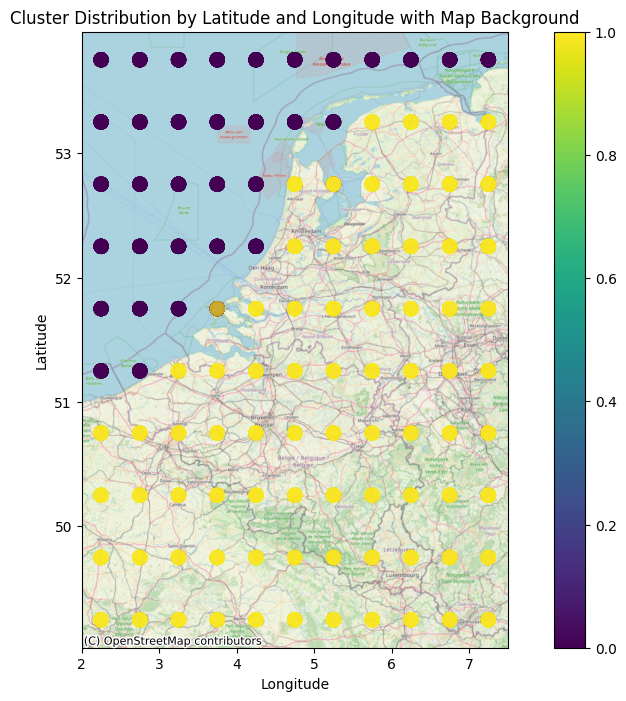

In [ ]:
# Plotting 2 clusters on a map
#------------------------------
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx
import matplotlib.pyplot as plt

# Add geographic info to PCA DataFrame for visualization
pca_df["latitude"] = metadata["latitude"]
pca_df["longitude"] = metadata["longitude"]

# Create GeoDataFrame for plotting on a map
geometry = [Point(xy) for xy in zip(pca_df["longitude"], pca_df["latitude"])]
gdf = gpd.GeoDataFrame(pca_df, geometry=geometry)

# Assign a CRS (WGS84, which is EPSG:4326) to the GeoDataFrame
gdf.crs = "EPSG:4326"

# Create the plot with a basemap using contextily
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the data points (clusters) on top of the basemap
gdf.plot(ax=ax, column="Cluster 2", cmap="viridis", alpha=0.2, legend=True, markersize=100)

# Add basemap for geographic context (OpenStreetMap in this case)
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Set title and labels
ax.set_title("Cluster Distribution by Latitude and Longitude with Map Background")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

# Show the plot
plt.show()



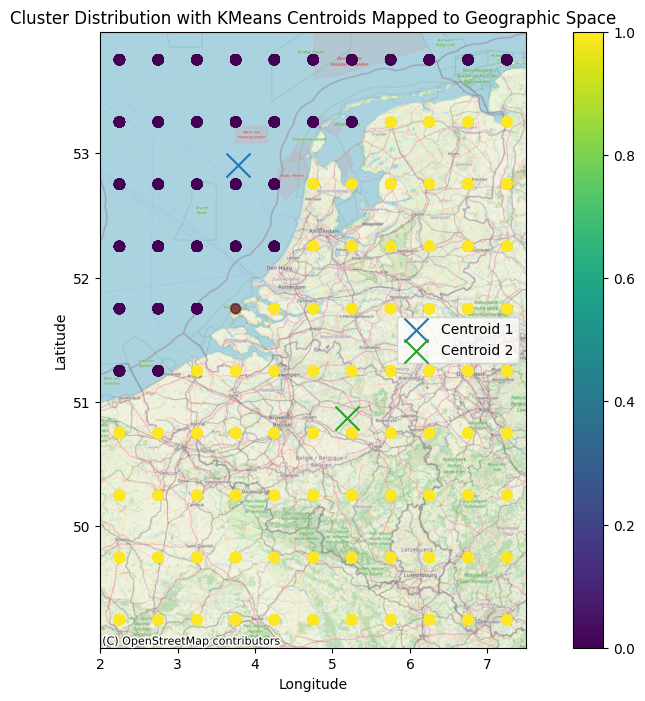

In [ ]:
from sklearn.decomposition import PCA
import pandas as pd

# Perform PCA to inverse-transform centroids back to original space
pca = PCA(n_components=15)  # Ensure it matches your KMeans n_components
pca.fit(data_scaled)  # Fit PCA on scaled data

# Inverse-transform centroids back to the original variable space
centroids_original = pca.inverse_transform(kmeans.cluster_centers_)

# Create a DataFrame for centroids using only PCA-transformed features
centroids_df = pd.DataFrame(centroids_original, columns=data_reduced_target.columns)

# Add latitude and longitude back to centroids by calculating the mean latitude and longitude for each cluster
for cluster_id in range(kmeans.n_clusters):
    cluster_points = metadata[kmeans.labels_ == cluster_id]
    centroids_df.loc[cluster_id, "latitude"] = cluster_points["latitude"].mean()
    centroids_df.loc[cluster_id, "longitude"] = cluster_points["longitude"].mean()

# Plot centroids on the map
fig, ax = plt.subplots(figsize=(12, 8))

# Plot data points (clusters) on the basemap
gdf.plot(ax=ax, column="Cluster", cmap="viridis", alpha=0.7, legend=True, markersize=50)

# Define colors for each centroid
centroid_colors = ["#1f77b4", "#2ca02c"]  # Blue for Centroid 1, Green for Centroid 2

# Plot centroids with specific colors
for i, row in centroids_df.iterrows():
    ax.scatter(
        row["longitude"],
        row["latitude"],
        color=centroid_colors[i],  # Assign color based on the cluster ID
        marker="x",
        s=300,
        label=f"Centroid {i+1}"
    )

# Add basemap
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Set labels and title
ax.set_title("Cluster Distribution with KMeans Centroids Mapped to Geographic Space")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.legend()
plt.show()





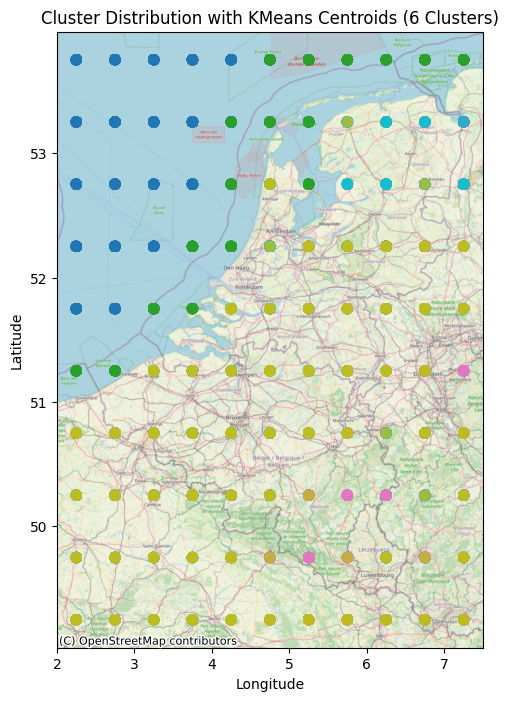

In [ ]:
# Plot 6 clusters on a map
#--------------------------
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx

# Perform PCA to inverse-transform centroids back to the original space
pca = PCA(n_components=15)  # Ensure it matches your KMeans n_components
pca.fit(data_scaled)  # Fit PCA on scaled data

# Inverse-transform centroids back to the original variable space
centroids_original = pca.inverse_transform(kmeans_6.cluster_centers_)  # Use 6-cluster KMeans

# Create a DataFrame for centroids using only PCA-transformed features
centroids_df = pd.DataFrame(centroids_original, columns=data_reduced_target.columns)

# Add latitude and longitude back to centroids by calculating the mean latitude and longitude for each cluster
for cluster_id in range(kmeans_6.n_clusters):
    cluster_points = metadata[kmeans_6.labels_ == cluster_id]
    centroids_df.loc[cluster_id, "latitude"] = cluster_points["latitude"].mean()
    centroids_df.loc[cluster_id, "longitude"] = cluster_points["longitude"].mean()

# Create a GeoDataFrame for plotting
geometry = [Point(xy) for xy in zip(metadata["longitude"], metadata["latitude"])]
gdf = gpd.GeoDataFrame(metadata, geometry=geometry)
gdf.crs = "EPSG:4326"

# Plot centroids on the map
fig, ax = plt.subplots(figsize=(12, 8))

# Plot data points (clusters) on the basemap
gdf["Cluster"] = kmeans_6.labels_  # Add 6-cluster labels to GeoDataFrame
gdf.plot(ax=ax, column="Cluster", cmap="tab10", alpha=0.8, legend=False, markersize=50)


# Add basemap
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Set labels and title
ax.set_title("Cluster Distribution with KMeans Centroids (6 Clusters)")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.show()


#### Hierarchical Clustering



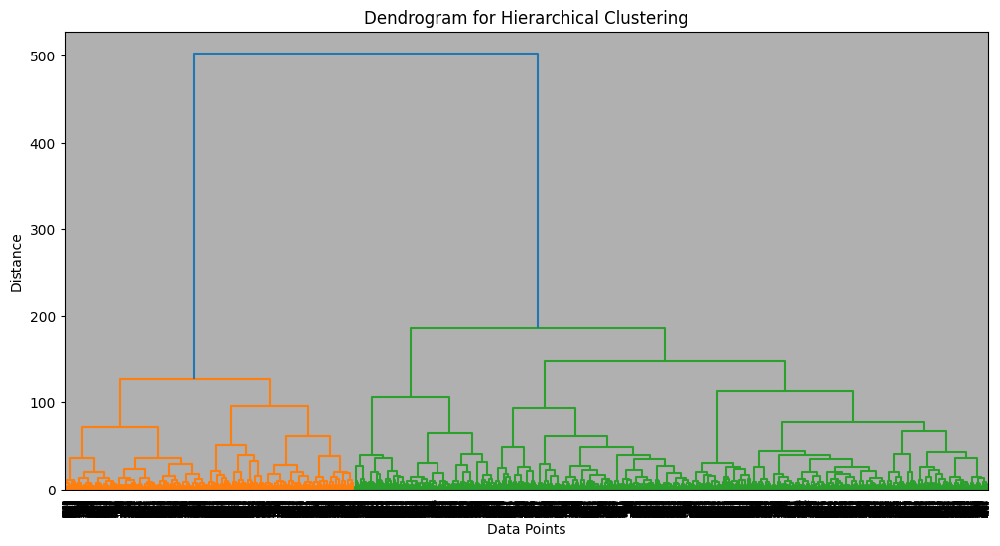

Number of clusters formed: 172


In [ ]:
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import fcluster
import matplotlib.pyplot as plt
import pandas as pd

# Hierarchical clustering on scaled PCA-reduced data
X = data_pca 

# Generate the linkage matrix using Ward's method
linkage_matrix = sch.linkage(X, method='ward')

# Plot the dendrogram
plt.figure(figsize=(12, 6))
dendrogram = sch.dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.grid()
plt.show()

# Assign clusters based on a distance threshold
depth_cut = 10  # Threshold for the distance to cut the dendrogram
hierarchical_clusters = fcluster(linkage_matrix, t=depth_cut, criterion='distance')

metadata["Hierarchical Cluster"] = hierarchical_clusters

# Print the number of clusters formed
print(f"Number of clusters formed: {len(set(hierarchical_clusters))}")
metadata.to_csv("metadata_with_hierarchical_clusters.csv", index=False)


In [145]:
# Ensure cluster labels are added to metadata
metadata["Hierarchical Cluster"] = hierarchical_clusters

# Combine the metadata with the original variables
data_with_clusters = pd.concat([data_reduced_target, metadata[["Hierarchical Cluster"]]], axis=1)

# Calculate mean values for original variables within each cluster
cluster_summary = data_with_clusters.groupby("Hierarchical Cluster").mean()

# Display the summary
print("Cluster Summary (Mean of Original Variables):")
print(cluster_summary)




Cluster Summary (Mean of Original Variables):
                      precipitation_warmest_quarter  \
Hierarchical Cluster                                  
1                                      2.255385e-08   
2                                      2.268214e-08   
3                                      2.181778e-08   
4                                      2.373721e-08   
5                                      2.506324e-08   
...                                             ...   
168                                    2.798140e-08   
169                                    2.890256e-08   
170                                    2.878462e-08   
171                                    2.911765e-08   
172                                    2.968889e-08   

                      surface-sensible-heat-flux_driest-quarter  \
Hierarchical Cluster                                              
1                                                     -2.867025   
2                                    

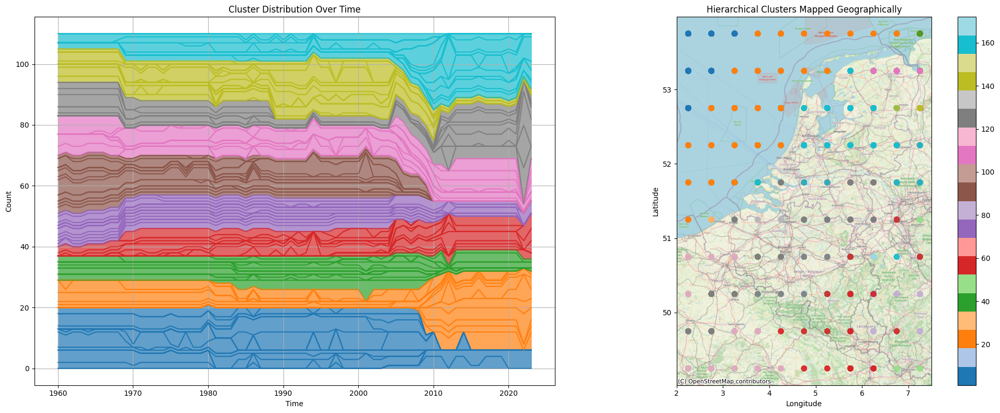

In [ ]:
# Plotting hierarchical clusters on stacked area and map
#-------------------------------------------------------
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
import contextily as ctx

# Group by time and cluster to count occurrences
time_cluster_counts = metadata.groupby(["time", "Hierarchical Cluster"]).size().unstack(fill_value=0)

# Create a GeoDataFrame for plotting
geometry = [Point(xy) for xy in zip(metadata["longitude"], metadata["latitude"])]
gdf = gpd.GeoDataFrame(metadata, geometry=geometry)
gdf.crs = "EPSG:4326"

# Set up the figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 8)) 

# Plot stacked area chart on the first subplot
time_cluster_counts.plot(
    kind="area",
    stacked=True,
    colormap="tab10",
    alpha=0.7,
    ax=axes[0],
    legend=False  
)
axes[0].set_title("Cluster Distribution Over Time")
axes[0].set_xlabel("Time")
axes[0].set_ylabel("Count")
axes[0].grid()

# Plot hierarchical clusters on the map in the second subplot
gdf.plot(
    ax=axes[1],
    column="Hierarchical Cluster",
    cmap="tab20",
    alpha=0.7,
    legend=True,
    markersize=50
)
ctx.add_basemap(axes[1], crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
axes[1].set_title("Hierarchical Clusters Mapped Geographically")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

plt.tight_layout()
plt.show()





/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_42392/1249582158.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_selected_clusters_numeric["time"] = selected_clusters["time"]
/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_42392/1249582158.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_selected_clusters_numeric["Hierarchical Cluster"] = selected_clusters["Hierarchical Cluster"]


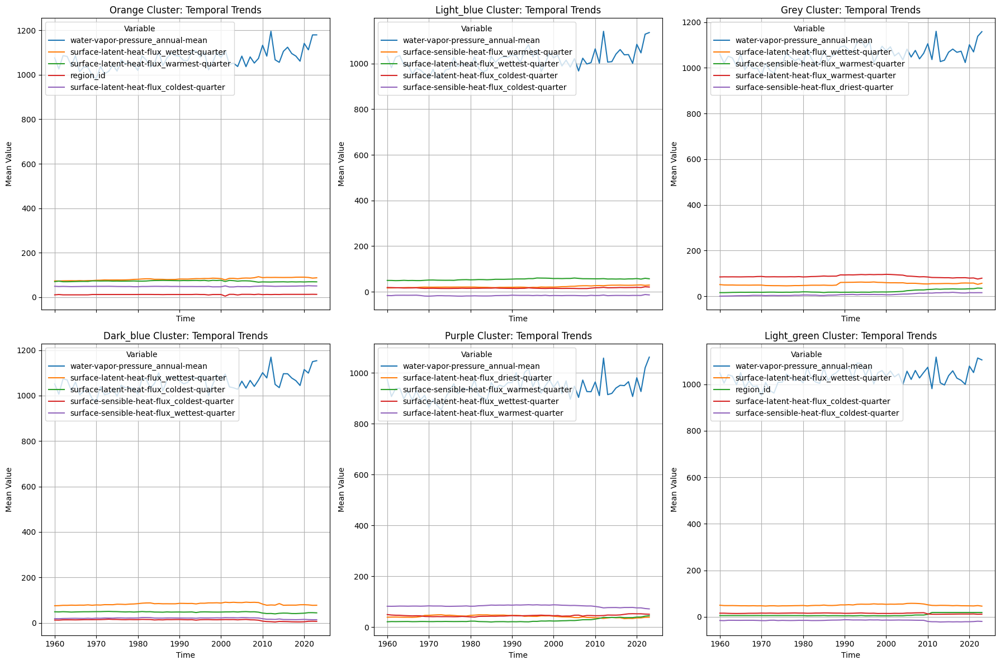

In [148]:
#dark blue = 1-18
#orange = 19-35
#dark green = 36-52
#red = 53-69
#purple = 70-86
#brown = 87-103
#pink = 104-120
#grey = 121-137
#light green = 138-154
#light blue = 155-172

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Define the clusters of interest
cluster_colors = {
    "orange": range(19, 36),
    "light_blue": range(155, 173),
    "grey": range(121, 138),
    "dark_blue": range(1, 19),
    "purple": range(70, 87),
    "light_green": range(138, 155),
}

# Filter metadata for the selected clusters
selected_clusters = metadata[
    metadata["Hierarchical Cluster"].isin(
        list(cluster_colors["orange"])
        + list(cluster_colors["light_blue"])
        + list(cluster_colors["grey"])
        + list(cluster_colors["dark_blue"])
        + list(cluster_colors["purple"])
        + list(cluster_colors["light_green"])
    )
]

# Merge original variables into the filtered metadata
data_selected_clusters = pd.merge(
    selected_clusters,
    data_reduced_target,
    left_index=True,
    right_index=True
)

# Select numeric columns only
numeric_columns = data_selected_clusters.select_dtypes(include=["number"]).columns
data_selected_clusters_numeric = data_selected_clusters[numeric_columns]

# Add back necessary columns for grouping
data_selected_clusters_numeric["time"] = selected_clusters["time"]
data_selected_clusters_numeric["Hierarchical Cluster"] = selected_clusters["Hierarchical Cluster"]

# Group data by time and cluster to calculate mean values for variables
grouped = data_selected_clusters_numeric.groupby(["time", "Hierarchical Cluster"]).mean()

# Identify the top variables for each cluster based on variance over time
top_variables = {}
for cluster_name, cluster_range in cluster_colors.items():
    cluster_data = grouped.loc[grouped.index.get_level_values("Hierarchical Cluster").isin(cluster_range)]
    variable_variances = cluster_data.var(axis=0)
    top_variables[cluster_name] = variable_variances.nlargest(5).index.tolist()

# Plot trends for the top variables for each cluster
fig, axes = plt.subplots(2, 3, figsize=(18, 12), sharex=True)

# Define subplot positions for the clusters
top_row_clusters = ["orange", "light_blue", "grey"]
bottom_row_clusters = ["dark_blue", "purple", "light_green"]

# Plot top row clusters
for i, cluster_name in enumerate(top_row_clusters):
    ax = axes[0, i]
    variables = top_variables[cluster_name]
    cluster_data = grouped.loc[grouped.index.get_level_values("Hierarchical Cluster").isin(cluster_colors[cluster_name])]
    time_means = cluster_data.groupby("time")[variables].mean()
    for variable in variables:
        ax.plot(time_means.index, time_means[variable], label=variable)
    ax.set_title(f"{cluster_name.capitalize()} Cluster: Temporal Trends")
    ax.set_xlabel("Time")
    ax.set_ylabel("Mean Value")
    ax.legend(title="Variable", loc="upper left")
    ax.grid()

# Plot bottom row clusters
for i, cluster_name in enumerate(bottom_row_clusters):
    ax = axes[1, i]
    variables = top_variables[cluster_name]
    cluster_data = grouped.loc[grouped.index.get_level_values("Hierarchical Cluster").isin(cluster_colors[cluster_name])]
    time_means = cluster_data.groupby("time")[variables].mean()
    for variable in variables:
        ax.plot(time_means.index, time_means[variable], label=variable)
    ax.set_title(f"{cluster_name.capitalize()} Cluster: Temporal Trends")
    ax.set_xlabel("Time")
    ax.set_ylabel("Mean Value")
    ax.legend(title="Variable", loc="upper left")
    ax.grid()

plt.tight_layout()
plt.show()


/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_42392/3113829422.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_selected_clusters_numeric["time"] = selected_clusters["time"]
/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_42392/3113829422.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_selected_clusters_numeric["Hierarchical Cluster"] = selected_clusters["Hierarchical Cluster"]


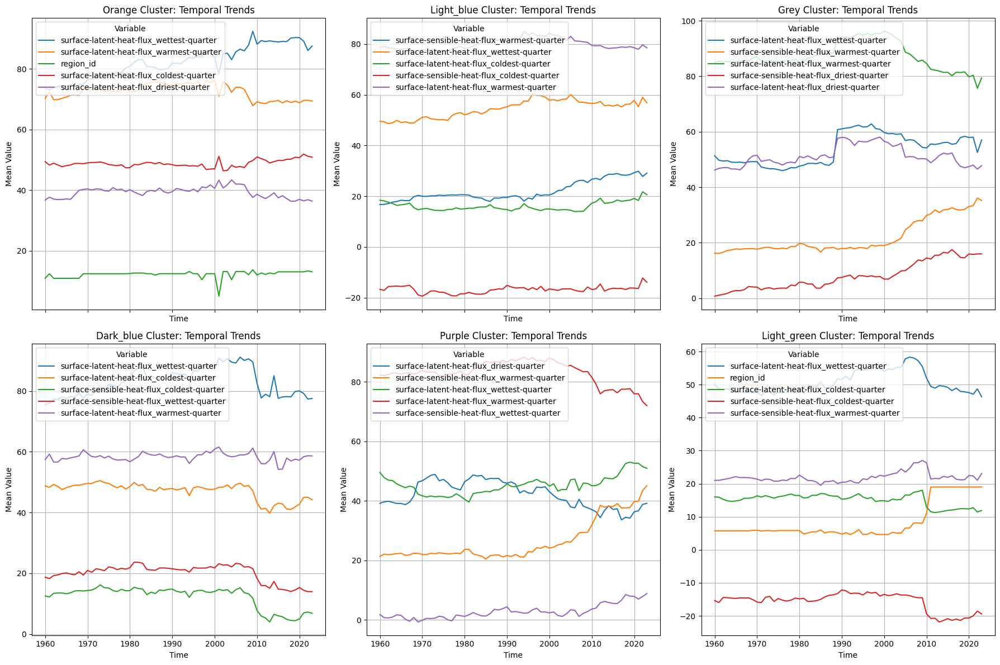

In [ ]:
# Plotting the top variables for each cluster, excluding water-vapor-pressure_annual-mean
#---------------------------------------------------------------------------------------
import matplotlib.pyplot as plt
import pandas as pd


# Define the clusters of interest
cluster_colors = {
    "orange": range(19, 36),
    "light_blue": range(155, 173),
    "grey": range(121, 138),
    "dark_blue": range(1, 19),
    "purple": range(70, 87),
    "light_green": range(138, 155),
}

# Filter metadata for the selected clusters
selected_clusters = metadata[
    metadata["Hierarchical Cluster"].isin(
        list(cluster_colors["orange"])
        + list(cluster_colors["light_blue"])
        + list(cluster_colors["grey"])
        + list(cluster_colors["dark_blue"])
        + list(cluster_colors["purple"])
        + list(cluster_colors["light_green"])
    )
]

# Merge original variables into the filtered metadata
data_selected_clusters = pd.merge(
    selected_clusters,
    data_reduced_target,
    left_index=True,
    right_index=True
)

# Select numeric columns only and exclude the specific variable
numeric_columns = data_selected_clusters.select_dtypes(include=["number"]).columns
numeric_columns = numeric_columns.difference(["water-vapor-pressure_annual-mean"])  # Exclude the variable
data_selected_clusters_numeric = data_selected_clusters[numeric_columns]

# Add back necessary columns for grouping
data_selected_clusters_numeric["time"] = selected_clusters["time"]
data_selected_clusters_numeric["Hierarchical Cluster"] = selected_clusters["Hierarchical Cluster"]

# Group data by time and cluster to calculate mean values for variables
grouped = data_selected_clusters_numeric.groupby(["time", "Hierarchical Cluster"]).mean()

# Identify the top variables for each cluster based on variance over time
top_variables = {}
for cluster_name, cluster_range in cluster_colors.items():
    cluster_data = grouped.loc[grouped.index.get_level_values("Hierarchical Cluster").isin(cluster_range)]
    variable_variances = cluster_data.var(axis=0)
    top_variables[cluster_name] = variable_variances.nlargest(5).index.tolist()

# Plot trends for the top variables for each cluster
fig, axes = plt.subplots(2, 3, figsize=(18, 12), sharex=True)

# Define subplot positions for the clusters
top_row_clusters = ["orange", "light_blue", "grey"]
bottom_row_clusters = ["dark_blue", "purple", "light_green"]

# Plot top row clusters
for i, cluster_name in enumerate(top_row_clusters):
    ax = axes[0, i]
    variables = top_variables[cluster_name]
    cluster_data = grouped.loc[grouped.index.get_level_values("Hierarchical Cluster").isin(cluster_colors[cluster_name])]
    time_means = cluster_data.groupby("time")[variables].mean()
    for variable in variables:
        ax.plot(time_means.index, time_means[variable], label=variable)
    ax.set_title(f"{cluster_name.capitalize()} Cluster: Temporal Trends")
    ax.set_xlabel("Time")
    ax.set_ylabel("Mean Value")
    ax.legend(title="Variable", loc="upper left")
    ax.grid()

# Plot bottom row clusters
for i, cluster_name in enumerate(bottom_row_clusters):
    ax = axes[1, i]
    variables = top_variables[cluster_name]
    cluster_data = grouped.loc[grouped.index.get_level_values("Hierarchical Cluster").isin(cluster_colors[cluster_name])]
    time_means = cluster_data.groupby("time")[variables].mean()
    for variable in variables:
        ax.plot(time_means.index, time_means[variable], label=variable)
    ax.set_title(f"{cluster_name.capitalize()} Cluster: Temporal Trends")
    ax.set_xlabel("Time")
    ax.set_ylabel("Mean Value")
    ax.legend(title="Variable", loc="upper left")
    ax.grid()

plt.tight_layout()
plt.show()


#### HDBSCAN

/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_42392/412115236.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=metadata["HDBSCAN Cluster"], palette="tab10")


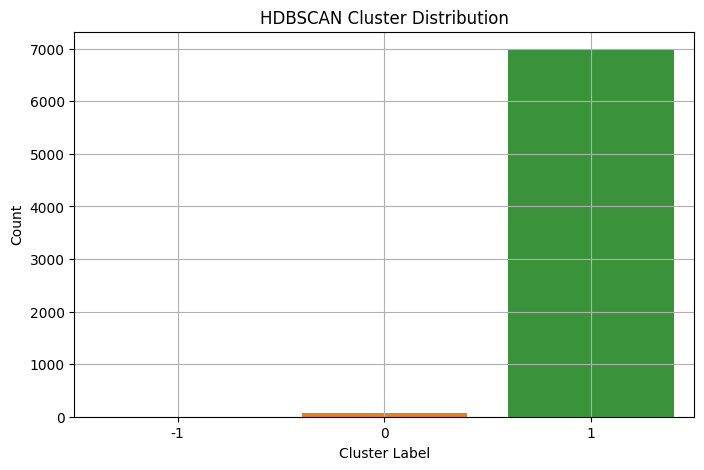

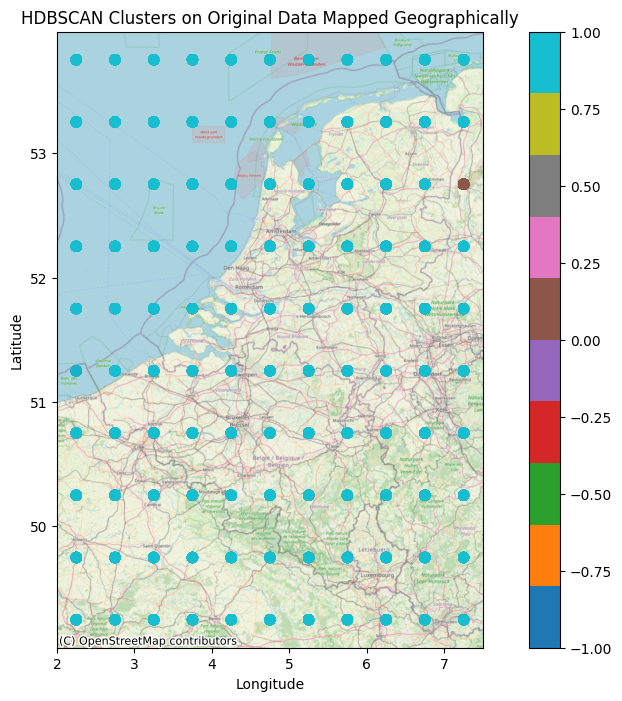

In [174]:
import hdbscan
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Run HDBSCAN on the original scaled data
hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=25, min_samples=5, metric='euclidean')
hdbscan_labels = hdbscan_clusterer.fit_predict(data_scaled)

# Add cluster labels to the metadata
metadata["HDBSCAN Cluster"] = hdbscan_labels

# Check the distribution of clusters
plt.figure(figsize=(8, 5))
sns.countplot(x=metadata["HDBSCAN Cluster"], palette="tab10")
plt.title("HDBSCAN Cluster Distribution")
plt.xlabel("Cluster Label")
plt.ylabel("Count")
plt.grid()
plt.show()

# Visualize clusters in terms of original geographic data
from shapely.geometry import Point
import geopandas as gpd
import contextily as ctx

# Create GeoDataFrame for visualization
geometry = [Point(xy) for xy in zip(metadata["longitude"], metadata["latitude"])]
gdf = gpd.GeoDataFrame(metadata, geometry=geometry)
gdf.crs = "EPSG:4326"

# Plot clusters on the map
fig, ax = plt.subplots(figsize=(12, 8))
gdf.plot(ax=ax, column="HDBSCAN Cluster", cmap="tab10", legend=True, markersize=50, alpha=0.7)

# Add basemap for geographic context
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Set labels and title
ax.set_title("HDBSCAN Clusters on Original Data Mapped Geographically")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.show()


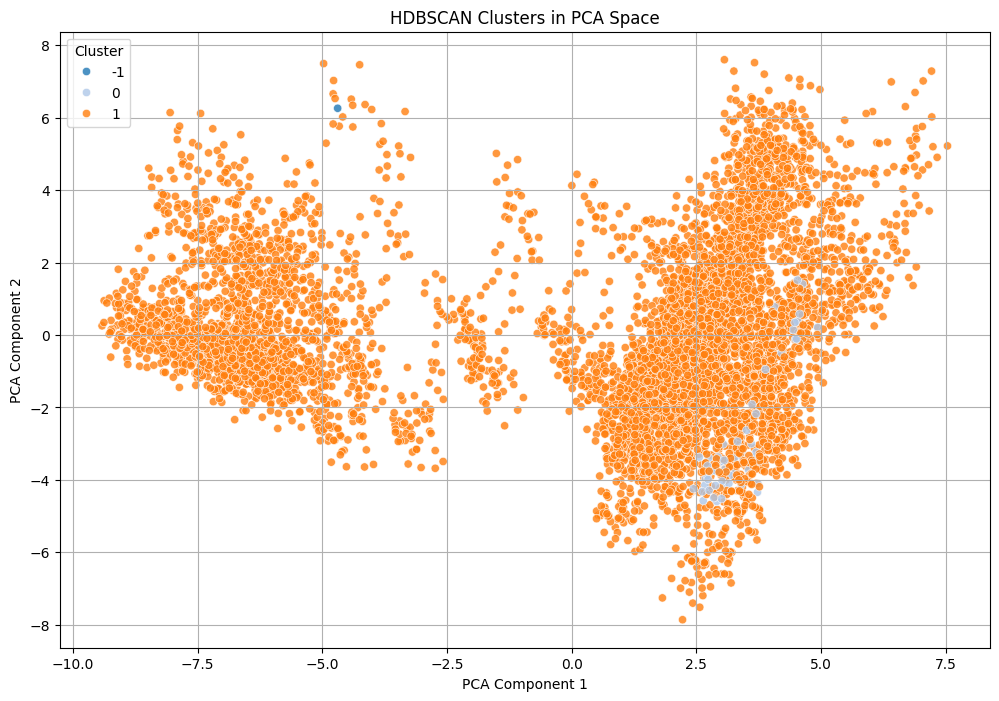

In [175]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=data_pca[:, 0],
    y=data_pca[:, 1],
    hue=hdbscan_labels,
    palette="tab20",
    legend="full",
    alpha=0.8
)
plt.title("HDBSCAN Clusters in PCA Space")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster", loc="best")
plt.grid()
plt.show()


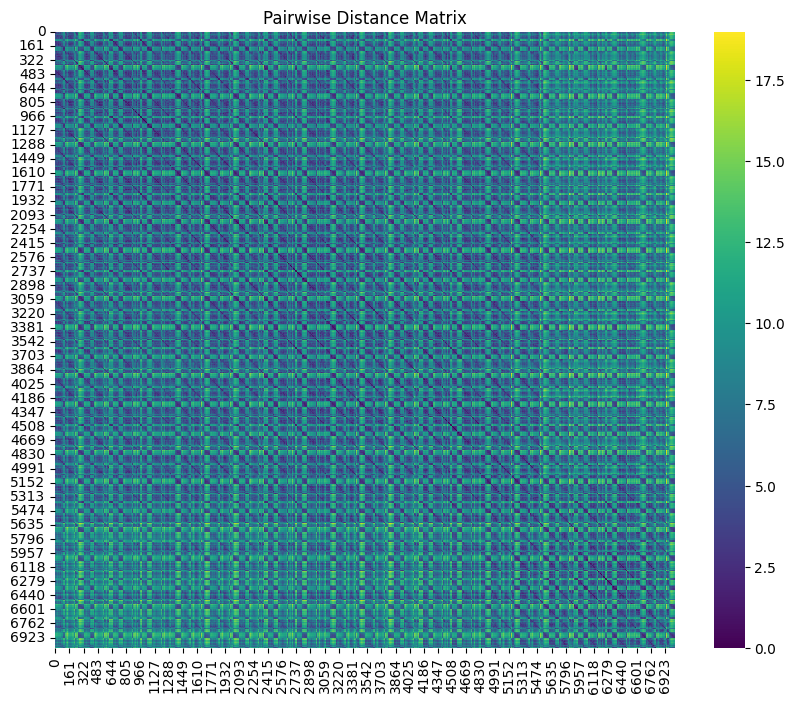

In [177]:
from sklearn.metrics import pairwise_distances
import seaborn as sns

# Calculate pairwise distances
distance_matrix = pairwise_distances(data_pca, metric="euclidean")

# Visualize the distance matrix
plt.figure(figsize=(10, 8))
sns.heatmap(distance_matrix, cmap="viridis")
plt.title("Pairwise Distance Matrix")
plt.show()

Estimated number of clusters: 2
Estimated number of noise points: 4


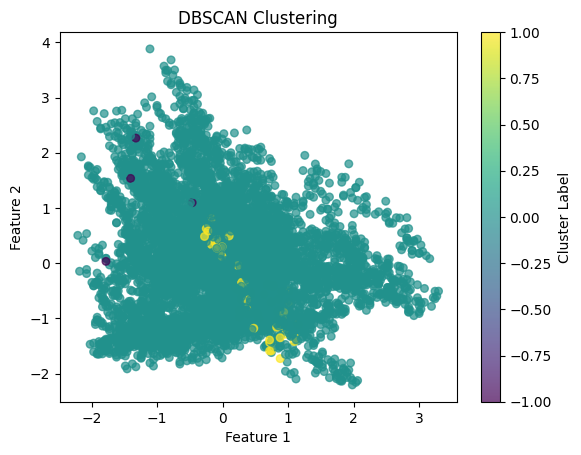

In [187]:
from sklearn.cluster import DBSCAN

# Apply DBSCAN
dbscan = DBSCAN(eps=2.7, min_samples=5)  # Adjust eps and min_samples as needed
dbscan_labels = dbscan.fit_predict(data_scaled)

# Count clusters (excluding noise, which is labeled as -1)
n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise = list(dbscan_labels).count(-1)
print(f"Estimated number of clusters: {n_clusters}")
print(f"Estimated number of noise points: {n_noise}")

# Visualize clustering results
plt.scatter(data_scaled[:, 0], data_scaled[:, 1], c=dbscan_labels, cmap="viridis", s=30, alpha=0.7)
plt.title("DBSCAN Clustering")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.colorbar(label="Cluster Label")
plt.show()

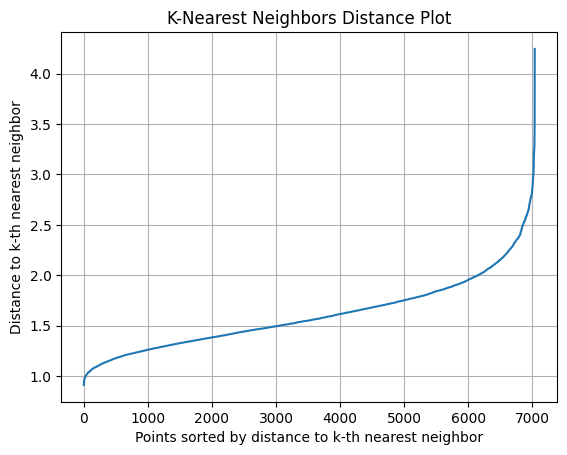

In [184]:
from sklearn.neighbors import NearestNeighbors

# Find distances to the k-th nearest neighbor
k = 10
neighbors = NearestNeighbors(n_neighbors=k)
neighbors_fit = neighbors.fit(data_scaled)
distances, indices = neighbors_fit.kneighbors(data_scaled)

# Sort distances and plot
distances = np.sort(distances[:, k-1])
plt.plot(distances)
plt.title("K-Nearest Neighbors Distance Plot")
plt.xlabel("Points sorted by distance to k-th nearest neighbor")
plt.ylabel("Distance to k-th nearest neighbor")
plt.grid()
plt.show()


## Topological Data Analysis

In [192]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
import json
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from returns.pipeline import flow
import random
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree

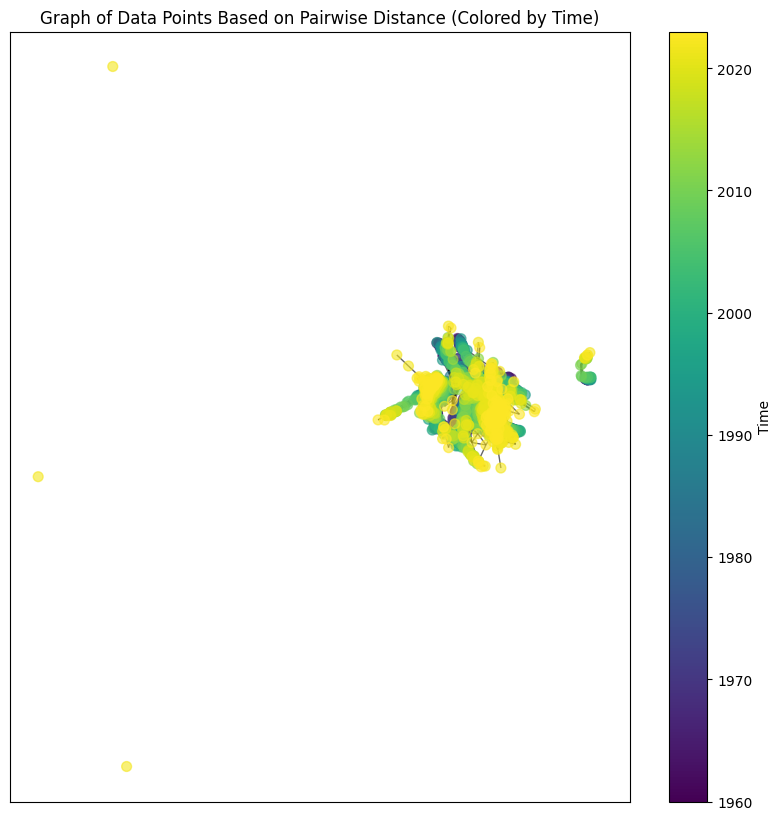

In [204]:
import networkx as nx
import numpy as np
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import matplotlib as mpl

# Example: Create a pairwise distance matrix using PCA data (or original data)
distance_matrix = pairwise_distances(data_pca)

# Create a graph from the distance matrix
G = nx.from_numpy_array(distance_matrix)

# Optional: Remove edges with distance greater than a threshold (e.g., epsilon in DBSCAN)
threshold = 2.5  # Adjust threshold based on your data

# Collect edges to be removed
edges_to_remove = [(u, v) for u, v, weight in G.edges(data=True) if weight['weight'] > threshold]

# Remove the collected edges
G.remove_edges_from(edges_to_remove)

# Map each node to its corresponding 'time' value from the metadata
node_time_mapping = {i: metadata["time"].iloc[i] for i in range(len(metadata))}

# Get the list of colors based on the time mapping
node_colors = [node_time_mapping[node] for node in G.nodes]

# Plot the graph with node colors based on time
plt.figure(figsize=(10, 10))

# Use a scatter plot to visualize the nodes and their colors
pos = nx.spring_layout(G)  # Layout for positioning nodes
nodes = nx.draw_networkx_nodes(G, pos, node_size=50, node_color=node_colors, alpha=0.6, cmap=plt.cm.viridis)

# Add edges
nx.draw_networkx_edges(G, pos, alpha=0.6)

# Create a colorbar based on node colors (time)
sm = mpl.cm.ScalarMappable(cmap=plt.cm.viridis, norm=mpl.colors.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
sm.set_array([])  # Required for colorbar

# Provide the ax argument explicitly to fix the error
plt.colorbar(sm, ax=plt.gca(), label="Time")

# Set plot title
plt.title("Graph of Data Points Based on Pairwise Distance (Colored by Time)")
plt.show()


Number of connected components: 5


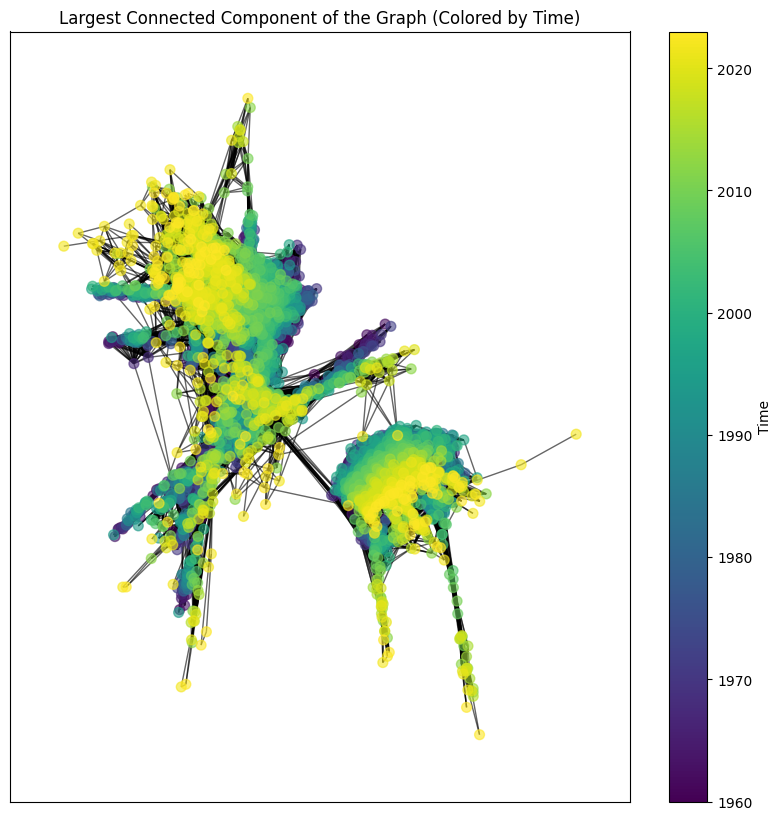

In [205]:
# Find connected components (H0 features)
connected_components = list(nx.connected_components(G))
print(f"Number of connected components: {len(connected_components)}")

# Visualize the largest connected component
largest_component = max(connected_components, key=len)
subgraph = G.subgraph(largest_component)

# Map each node in the largest component to its corresponding 'time' value from metadata
node_time_mapping = {node: metadata["time"].iloc[node] for node in largest_component}

# Get the list of colors based on the time mapping
node_colors = [node_time_mapping[node] for node in subgraph.nodes]

# Plot the graph of the largest connected component with node colors based on 'time'
plt.figure(figsize=(10, 10))

# Use a scatter plot to visualize the nodes and their colors
pos = nx.spring_layout(subgraph)  # Layout for positioning nodes
nodes = nx.draw_networkx_nodes(subgraph, pos, node_size=50, node_color=node_colors, alpha=0.6, cmap=plt.cm.viridis)

# Add edges
nx.draw_networkx_edges(subgraph, pos, alpha=0.6)

# Create a colorbar based on node colors (time)
sm = mpl.cm.ScalarMappable(cmap=plt.cm.viridis, norm=mpl.colors.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
sm.set_array([])  # Required for colorbar

# Add color bar to the plot
plt.colorbar(sm, ax=plt.gca(), label="Time")

# Set plot title
plt.title("Largest Connected Component of the Graph (Colored by Time)")
plt.show()


Node 0 has betweenness centrality 4301.4048
Node 1 has betweenness centrality 3543.0245
Node 2 has betweenness centrality 2733.6901
Node 3 has betweenness centrality 625.8722
Node 4 has betweenness centrality 1680.9782
Node 5 has betweenness centrality 4940.6444
Node 6 has betweenness centrality 707.1274
Node 7 has betweenness centrality 2574.4455
Node 8 has betweenness centrality 20167.8151
Node 9 has betweenness centrality 91015.0230
Node 10 has betweenness centrality 10303.7813
Node 11 has betweenness centrality 174.5136
Node 12 has betweenness centrality 221.8269
Node 13 has betweenness centrality 18668.7305
Node 14 has betweenness centrality 14526.7114
Node 15 has betweenness centrality 4464.3189
Node 16 has betweenness centrality 9371.8336
Node 17 has betweenness centrality 22939.1383
Node 18 has betweenness centrality 1307.9285
Node 19 has betweenness centrality 1203.8963
Node 20 has betweenness centrality 3320.5813
Node 21 has betweenness centrality 1380.6573
Node 22 has betwee

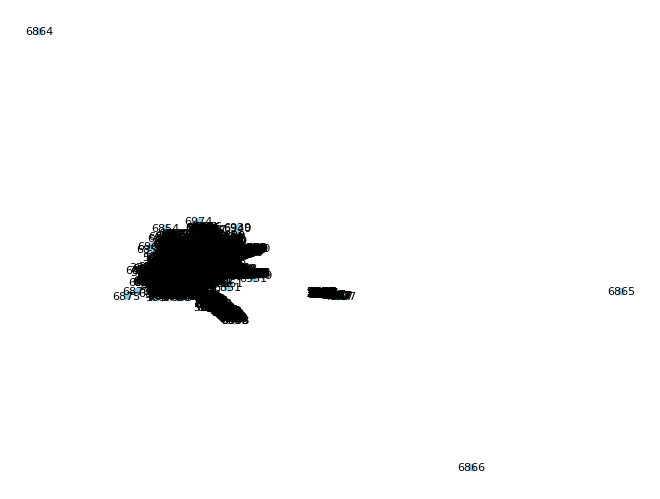

In [206]:
import networkx as nx
import numpy as np
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt

# Assume you already have the scaled data (data_scaled)
# Create a pairwise distance matrix
distance_matrix = pairwise_distances(data_scaled, metric='euclidean')

# Create a graph from the distance matrix (using a threshold for the edges, e.g., epsilon distance)
threshold = 2.5  # Adjust based on your data
graph = nx.Graph()

# Add nodes
for i in range(len(data_scaled)):
    graph.add_node(i)

# Add edges based on the distance threshold
for i in range(len(data_scaled)):
    for j in range(i+1, len(data_scaled)):  # To avoid self-loops
        if distance_matrix[i, j] <= threshold:
            graph.add_edge(i, j, weight=distance_matrix[i, j])

# Calculate betweenness centrality using Brandes' algorithm
def brandes_betweenness_centrality(G):
    betweenness = {v: 0.0 for v in G.nodes()}
    for s in G.nodes():
        pred = {v: [] for v in G.nodes()}
        dist = {v: float('inf') for v in G.nodes()}
        dist[s] = 0
        stack = []
        queue = [s]
        
        while queue:
            v = queue.pop(0)
            stack.append(v)
            for w in G.neighbors(v):
                if dist[w] == float('inf'):
                    dist[w] = dist[v] + 1
                    queue.append(w)
                if dist[w] == dist[v] + 1:
                    pred[w].append(v)
        
        dependency = {v: 0.0 for v in G.nodes()}
        
        while stack:
            w = stack.pop()
            for v in pred[w]:
                dependency[v] += (1 + dependency[w]) / len(pred[w])
            if w != s:
                betweenness[w] += dependency[w]
    
    return betweenness

# Run the betweenness centrality calculation on the graph
bc = brandes_betweenness_centrality(graph)

# Display results
for node, centrality in bc.items():
    print(f"Node {node} has betweenness centrality {centrality:.4f}")

# Optionally, visualize the graph (if the graph is not too large)
pos = nx.spring_layout(graph)  # layout positions for nodes
nx.draw(graph, pos, with_labels=True, node_size=20, font_size=8, node_color='skyblue')
plt.show()


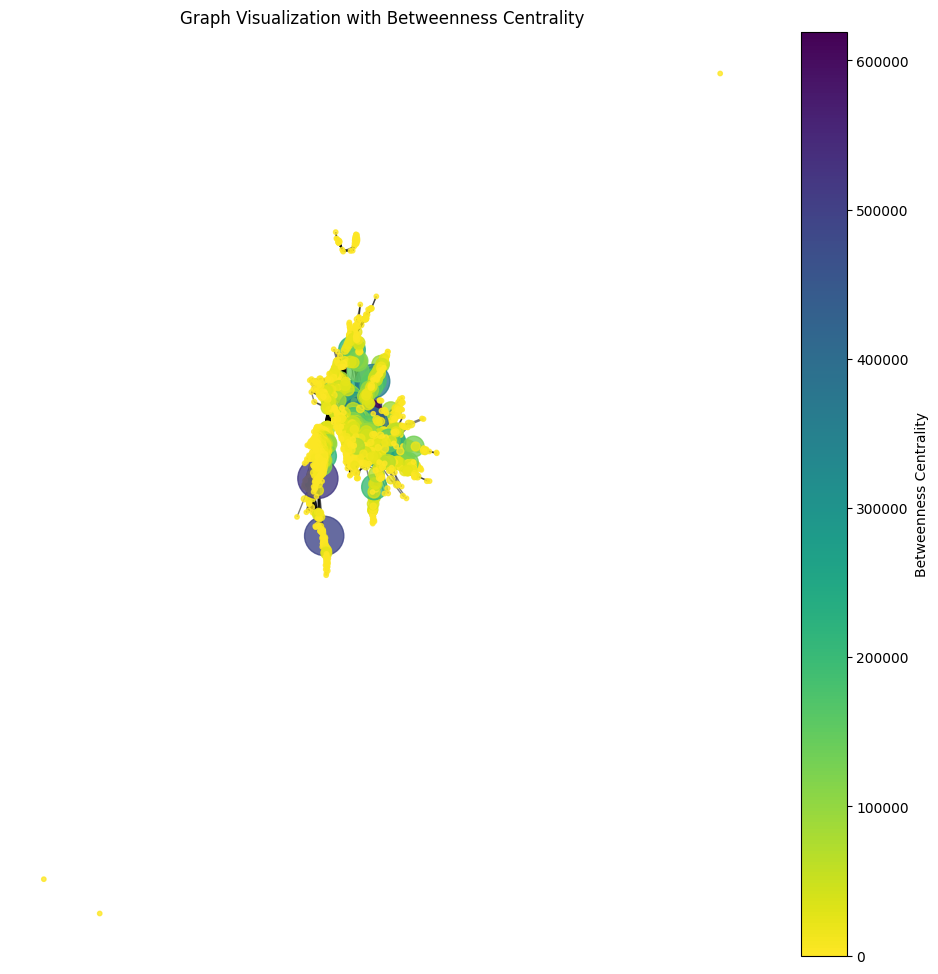

In [213]:
# Normalize the betweenness centrality values to range [0, 1] for better visualization
bc_values = np.array(list(bc.values()))
min_bc, max_bc = bc_values.min(), bc_values.max()

# Avoid uniform scaling by adding a small constant if min == max
if min_bc == max_bc:
    min_bc -= 1e-6

norm_bc = (bc_values - min_bc) / (max_bc - min_bc)

# Node sizes scaled by normalized centrality values
node_sizes = norm_bc * 1000 + 10  # Scale sizes to a visually appropriate range

# Colormap for centrality values
cmap = plt.cm.viridis_r

# Position nodes using a layout
pos = nx.spring_layout(graph, seed=42)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 12))

# Draw nodes with size and color based on normalized betweenness centrality
nodes = nx.draw_networkx_nodes(
    graph, pos, ax=ax,
    node_size=node_sizes,
    node_color=norm_bc,
    cmap=cmap,
    alpha=0.8
)

# Draw edges
nx.draw_networkx_edges(graph, pos, ax=ax, alpha=0.5)

# Add a colorbar for centrality values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min_bc, vmax=max_bc))
sm.set_array([])
fig.colorbar(sm, ax=ax, label="Betweenness Centrality")

# Set title and axis labels
plt.title("Graph Visualization with Betweenness Centrality")
plt.axis("off")  # Turn off axes for cleaner visualization
plt.show()

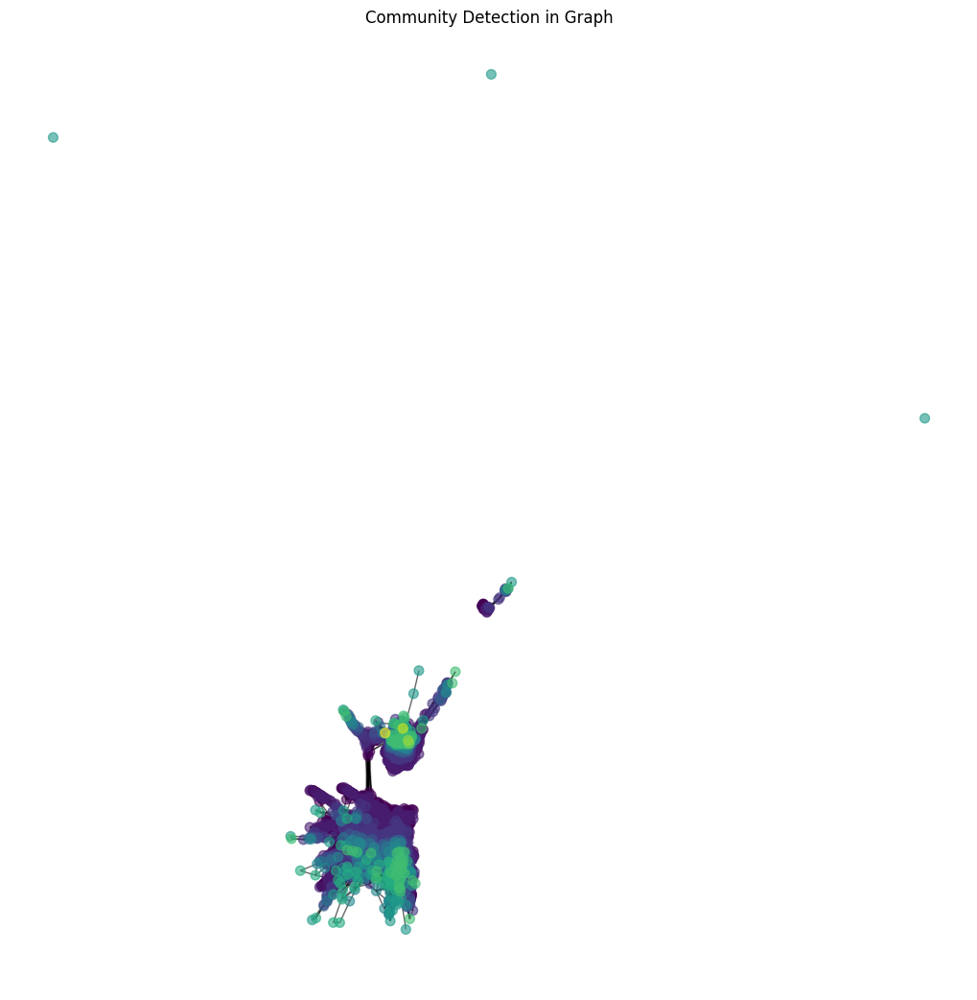

In [207]:
from networkx.algorithms.community import greedy_modularity_communities

# Detect communities using the Louvain method (greedy modularity)
communities = list(greedy_modularity_communities(G))

# Plot the communities
plt.figure(figsize=(10, 10))
colors = [i for i, community in enumerate(communities) for _ in community]
nx.draw(G, node_size=50, node_color=colors, alpha=0.6, with_labels=False)
plt.title("Community Detection in Graph")
plt.show()


#### Mapper

In [ ]:

import pandas as pd
from sklearn.decomposition import PCA
import networkx as nx
import matplotlib.pyplot as plt

In [23]:
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
map_data_scaled = scaler.fit_transform(data)

# Perform PCA
pca = PCA(n_components=15)  # Adjust dimensions as needed
map_data_pca = pca.fit_transform(data_scaled)

# Convert to a DataFrame for easier handling
map_pca_df = pd.DataFrame(map_data_pca, columns=["PCA_1", "PCA_2", "PCA_3", "PCA_4", "PCA_5", "PCA_6", "PCA_7", "PCA_8", "PCA_9", "PCA_10", "PCA_11", "PCA_12", "PCA_13", "PCA_14", "PCA_15"])

In [24]:
# Define the cover parameters
n_intervals = 10  # Number of intervals per dimension
overlap = 0.3  # Overlap percentage

# Calculate interval bounds
intervals_x = np.linspace(pca_df["PCA_1"].min(), pca_df["PCA_1"].max(), n_intervals)
intervals_y = np.linspace(pca_df["PCA_2"].min(), pca_df["PCA_2"].max(), n_intervals)

# Define overlapping bins
def create_bins(intervals, overlap):
    bins = []
    step = intervals[1] - intervals[0]
    overlap_step = step * overlap
    for i in range(len(intervals) - 1):
        bins.append((intervals[i] - overlap_step, intervals[i + 1] + overlap_step))
    return bins

bins_x = create_bins(intervals_x, overlap)
bins_y = create_bins(intervals_y, overlap)


In [ ]:
# Cluster points in overlapping regions
clusters = []
for x_bin in bins_x:
    for y_bin in bins_y:
        # Filter points within the current bin
        subset = pca_df[
            (pca_df["PCA_1"] >= x_bin[0]) & (pca_df["PCA_1"] <= x_bin[1]) &
            (pca_df["PCA_2"] >= y_bin[0]) & (pca_df["PCA_2"] <= y_bin[1])
        ]
        
        if len(subset) > 1:  # Only cluster if there are enough points
            clusterer = KMeans(n_clusters=6, random_state=42)
            cluster_labels = clusterer.fit_predict(subset)
            
            clusters.append({
                "points": subset,
                "labels": cluster_labels,
                "bounds": (x_bin, y_bin)
            })


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.1

In [27]:
# Initialize graph
graph = nx.Graph()

# Add nodes for each cluster
node_id = 0
node_mapping = {}
for cluster in clusters:
    for cluster_label in np.unique(cluster["labels"]):
        # Create a node for each unique cluster
        points_in_cluster = cluster["points"][cluster["labels"] == cluster_label]
        node_mapping[node_id] = points_in_cluster.index.tolist()
        graph.add_node(node_id, size=len(points_in_cluster))
        node_id += 1

# Add edges between overlapping clusters
for i, cluster_i in enumerate(clusters):
    for j, cluster_j in enumerate(clusters):
        if i >= j:
            continue  # Avoid duplicate edges
        for node_i, points_i in node_mapping.items():
            for node_j, points_j in node_mapping.items():
                if set(points_i) & set(points_j):  # Check for shared points
                    graph.add_edge(node_i, node_j)


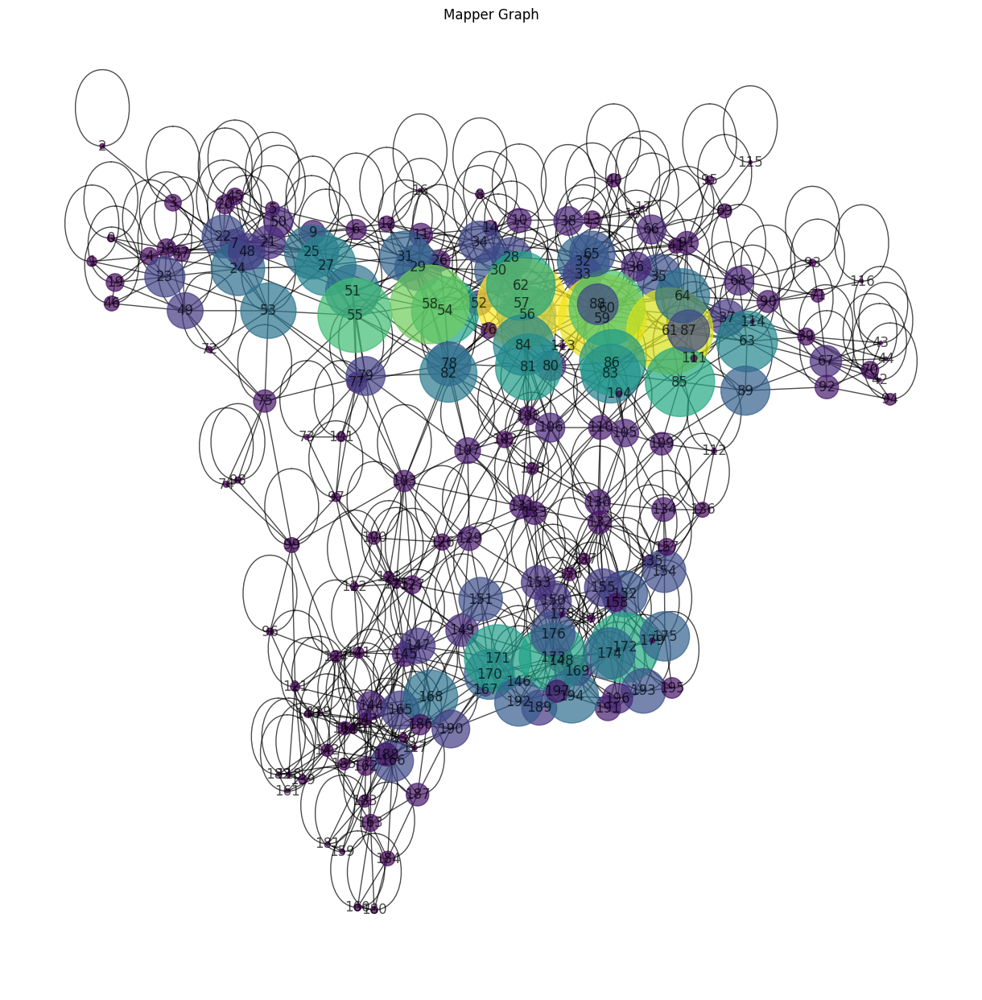

In [28]:
# Draw the graph
sizes = [graph.nodes[node]["size"] * 10 for node in graph.nodes]  # Scale node sizes
pos = nx.spring_layout(graph, seed=42)  # Layout for visualization
plt.figure(figsize=(12, 12))
nx.draw(
    graph, pos,
    node_size=sizes,
    with_labels=True,
    alpha=0.7,
    cmap=plt.cm.viridis,
    node_color=sizes
)
plt.title("Mapper Graph")
plt.show()


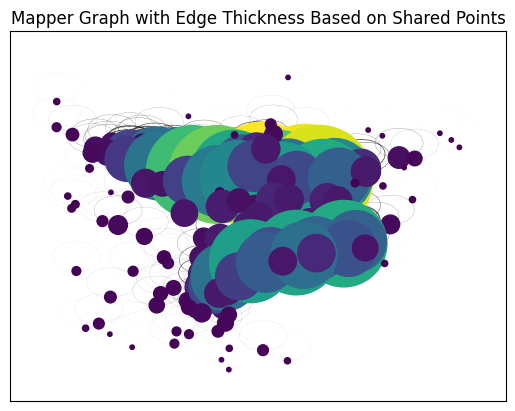

In [29]:
# Initialize graph
graph = nx.Graph()

# Add nodes for each cluster
node_id = 0
node_mapping = {}
for cluster in clusters:
    for cluster_label in np.unique(cluster["labels"]):
        # Create a node for each unique cluster
        points_in_cluster = cluster["points"][cluster["labels"] == cluster_label]
        node_mapping[node_id] = points_in_cluster.index.tolist()
        graph.add_node(node_id, size=len(points_in_cluster))
        node_id += 1

# Add edges between overlapping clusters with weights based on shared points
for i, cluster_i in enumerate(clusters):
    for j, cluster_j in enumerate(clusters):
        if i >= j:
            continue  # Avoid duplicate edges
        for node_i, points_i in node_mapping.items():
            for node_j, points_j in node_mapping.items():
                # Calculate the number of shared points
                shared_points = len(set(points_i) & set(points_j))
                if shared_points > 0:  # Only add an edge if there is an overlap
                    graph.add_edge(node_i, node_j, weight=shared_points)

# Draw the graph with edge thickness based on weight
edges, weights = zip(*nx.get_edge_attributes(graph, 'weight').items())  # Get edge weights

# Scale edge weights for visualization
weights_scaled = [weight / max(weights) * 5 for weight in weights]  # Scale to a max thickness of 5

# Graph layout
pos = nx.spring_layout(graph, seed=42)

# Draw nodes
sizes = [graph.nodes[node]["size"] * 10 for node in graph.nodes]  # Scale node sizes
node_colors = sizes  # Node colors based on size (optional)
nx.draw_networkx_nodes(graph, pos, node_size=sizes, node_color=node_colors, cmap=plt.cm.viridis)

# Draw edges with thickness
nx.draw_networkx_edges(graph, pos, edgelist=edges, width=weights_scaled, alpha=0.6)

# Add title and display
plt.title("Mapper Graph with Edge Thickness Based on Shared Points")
plt.show()

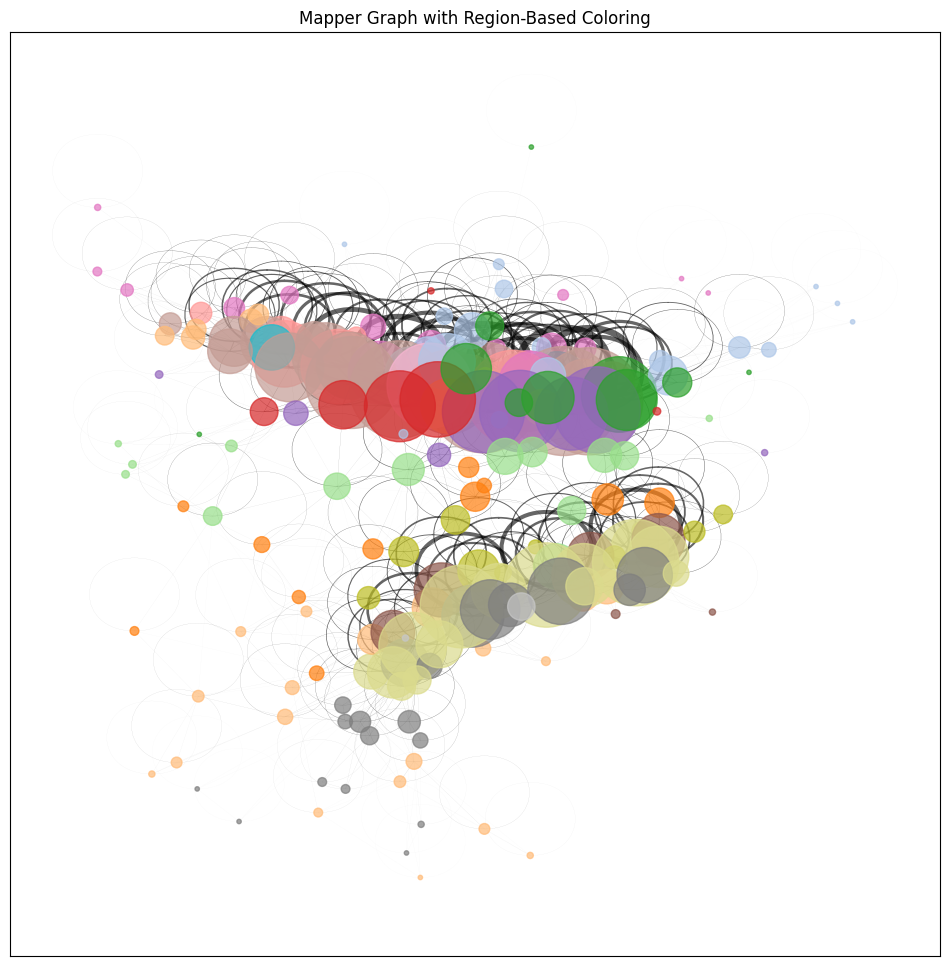

In [ ]:


import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd


# Map metadata to PCA-reduced data (if not already done)
pca_metadata = pd.concat([pca_df, metadata["region"]], axis=1)

# Initialize graph
graph = nx.Graph()

# Add nodes for each cluster and include region attribute
node_id = 0
node_mapping = {}
for cluster in clusters:
    for cluster_label in np.unique(cluster["labels"]):
        points_in_cluster = cluster["points"][cluster["labels"] == cluster_label]
        # Determine the most common region within the cluster
        regions = pd.Series(points_in_cluster.index.map(lambda idx: pca_metadata.loc[idx, "region"]))
        main_region = regions.mode()[0]  # Most common region
        node_mapping[node_id] = points_in_cluster.index.tolist()
        graph.add_node(node_id, size=len(points_in_cluster), region=main_region)
        node_id += 1

# Add edges between overlapping clusters with weights based on shared points
for i, cluster_i in enumerate(clusters):
    for j, cluster_j in enumerate(clusters):
        if i >= j:
            continue  # Avoid duplicate edges
        for node_i, points_i in node_mapping.items():
            for node_j, points_j in node_mapping.items():
                shared_points = len(set(points_i) & set(points_j))
                if shared_points > 0:  # Only add an edge if there is an overlap
                    graph.add_edge(node_i, node_j, weight=shared_points)

# Prepare color mapping for regions
regions = [graph.nodes[node]["region"] for node in graph.nodes]
unique_regions = list(set(regions))
region_to_color = {region: plt.cm.tab20(i / len(unique_regions)) for i, region in enumerate(unique_regions)}
node_colors = [region_to_color[graph.nodes[node]["region"]] for node in graph.nodes]

# Draw the graph with region-based colors
edges, weights = zip(*nx.get_edge_attributes(graph, 'weight').items())  # Get edge weights
weights_scaled = [weight / max(weights) * 5 for weight in weights]  # Scale to a max thickness of 5
sizes = [graph.nodes[node]["size"] * 10 for node in graph.nodes]  # Scale node sizes

# Graph layout
pos = nx.spring_layout(graph, seed=42)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 12))

# Draw nodes with region-based coloring
nx.draw_networkx_nodes(graph, pos, node_size=sizes, node_color=node_colors, alpha=0.7, ax=ax)

# Draw edges with thickness
nx.draw_networkx_edges(graph, pos, edgelist=edges, width=weights_scaled, alpha=0.6, ax=ax)


# Add title and display
plt.title("Mapper Graph with Region-Based Coloring")
plt.show()


In [53]:
# Initialize graph
graph = nx.Graph()

# Add nodes for each cluster and include region and time attributes
node_id = 0
node_mapping = {}
for cluster in clusters:
    for cluster_label in np.unique(cluster["labels"]):
        points_in_cluster = cluster["points"][cluster["labels"] == cluster_label]
        
        # Determine the most common region within the cluster
        regions = pd.Series(points_in_cluster.index.map(lambda idx: metadata.loc[idx, "region"]))
        main_region = regions.mode()[0]  # Most common region
        
        # Calculate the average time for the cluster from metadata
        times = points_in_cluster.index.map(lambda idx: metadata.loc[idx, "time"]).to_numpy()
        avg_time = times.mean()  # Convert to numpy array and calculate mean
        
        # Add node to graph
        node_mapping[node_id] = points_in_cluster.index.tolist()
        graph.add_node(node_id, size=len(points_in_cluster), region=main_region, time=avg_time)
        node_id += 1

# Add edges between overlapping clusters with weights based on shared points
for i, cluster_i in enumerate(clusters):
    for j, cluster_j in enumerate(clusters):
        if i >= j:
            continue  # Avoid duplicate edges
        for node_i, points_i in node_mapping.items():
            for node_j, points_j in node_mapping.items():
                shared_points = len(set(points_i) & set(points_j))
                if shared_points > 0:  # Only add an edge if there is an overlap
                    graph.add_edge(node_i, node_j, weight=shared_points)

# Prepare color mapping for time
node_times = [graph.nodes[node]["time"] for node in graph.nodes]
min_time, max_time = min(node_times), max(node_times)
norm = plt.Normalize(vmin=min_time, vmax=max_time)
time_colors = [plt.cm.viridis(norm(graph.nodes[node]["time"])) for node in graph.nodes]

# Draw the graph
edges, weights = zip(*nx.get_edge_attributes(graph, 'weight').items())  # Get edge weights
weights_scaled = [weight / max(weights) * 5 for weight in weights]  # Scale to a max thickness of 5
sizes = [graph.nodes[node]["size"] * 10 for node in graph.nodes]  # Scale node sizes

# Graph layout
pos = nx.spring_layout(graph, seed=42)

# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 12))

# Draw nodes with time-based coloring
nodes = nx.draw_networkx_nodes(
    graph, pos, node_size=sizes, node_color=node_times, cmap=plt.cm.viridis, ax=ax, alpha=0.8
)

# Draw edges with thickness
nx.draw_networkx_edges(graph, pos, edgelist=edges, width=weights_scaled, alpha=0.6, ax=ax)

# Add colorbar for time
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, label="Time")

# Add title and display
plt.title("Mapper Graph Colored by Time")
plt.show()


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3433, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/52/v1gpfmxd54d6bqwl7msx6jb40000gn/T/ipykernel_96462/843428255.py", line -1, in <module>
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 2052, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/ultratb.py", line 1112, in structured_traceback
    return FormattedTB.structured_traceback(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Library/Frameworks/Python.framew

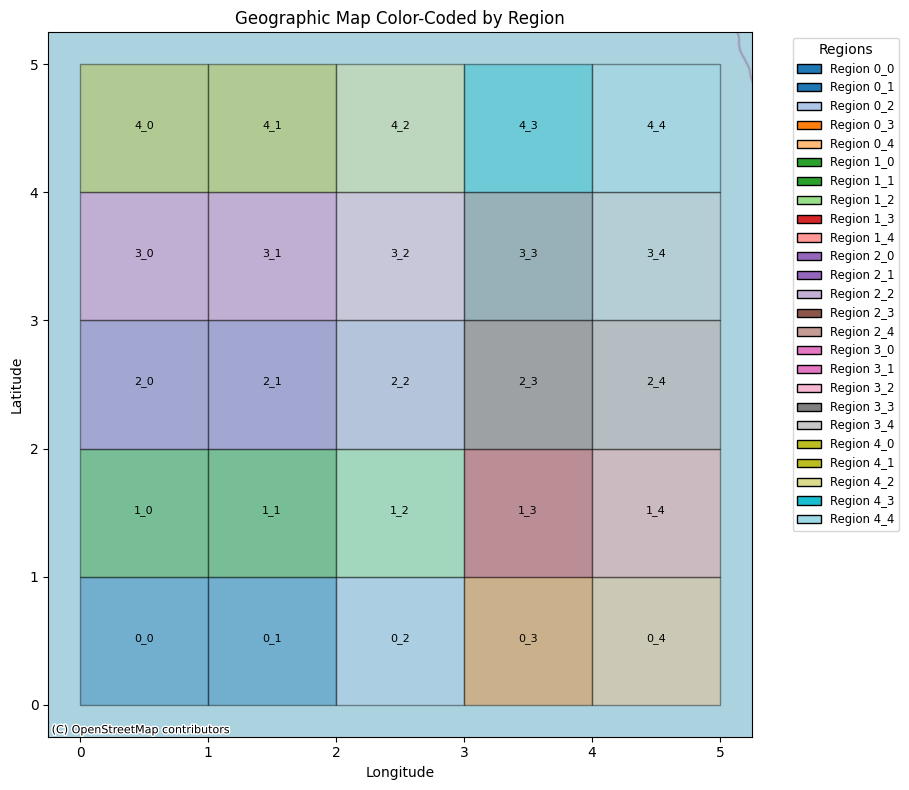

In [61]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
from matplotlib.patches import Patch

# Step 1: Load the metadata from the provided Excel file
metadata = pd.read_csv("metadata_with_hierarchical_clusters.csv")

# Step 2: Create polygons for each region using lat_bin and lon_bin
regions = metadata["region"].unique()
region_polygons = []
region_colors = {}

# Assign random colors to regions for demonstration
cmap = plt.cm.tab20
for i, region in enumerate(regions):
    region_data = metadata[metadata["region"] == region]
    lat_bin = region_data["lat_bin"].iloc[0]
    lon_bin = region_data["lon_bin"].iloc[0]

    # Define polygon boundaries based on lat_bin and lon_bin
    lat_start = lat_bin
    lat_end = lat_bin + 1
    lon_start = lon_bin
    lon_end = lon_bin + 1
    polygon = Polygon([
        (lon_start, lat_start),
        (lon_start, lat_end),
        (lon_end, lat_end),
        (lon_end, lat_start)
    ])
    region_polygons.append(polygon)
    region_colors[region] = cmap(i / len(regions))

# Step 3: Create a GeoDataFrame
regions_gdf = gpd.GeoDataFrame({
    "region": regions,
    "geometry": region_polygons
}, crs="EPSG:4326")

# Step 4: Plot the regions on a map
fig, ax = plt.subplots(figsize=(12, 8))

# Assign colors to regions
regions_gdf["color"] = regions_gdf["region"].map(region_colors)

# Plot regions
regions_gdf.plot(ax=ax, color=regions_gdf["color"], edgecolor="black", alpha=0.4)

# Add labels for each region
for idx, row in regions_gdf.iterrows():
    centroid = row["geometry"].centroid
    ax.text(centroid.x, centroid.y, row["region"], fontsize=8, ha="center", color="black")

# Create a legend
legend_elements = [
    Patch(facecolor=color, edgecolor="black", label=f"Region {region}")
    for region, color in region_colors.items()
]

ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
# Add legend to the side, overlapping the map
ax.legend(
    handles=legend_elements,
    title="Regions",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),  # Place legend outside the plot to the right
    fontsize="small",
    frameon=True
)

# Map details
plt.title("Geographic Map Color-Coded by Region")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()


